## Import thư viện

In [1]:
try:
    from torch.amp import GradScaler, autocast
    _NEW_AMP = True
except Exception:
    from torch.cuda.amp import GradScaler, autocast
    _NEW_AMP = False

from torchvision.models import (
    resnet18, ResNet18_Weights,
    resnet50, ResNet50_Weights,
    efficientnet_b0, EfficientNet_B0_Weights,
    mobilenet_v2, MobileNet_V2_Weights,
)
import torchvision.transforms as T
import torch.nn.functional as F
import torchvision.datasets as dsets

In [2]:
import os, re, shutil, random, pathlib, cv2, torch, gc, time, math 
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix, classification_report
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
from torch.utils.data import DataLoader
from contextlib import nullcontext

import torch.nn as nn
import torch.optim as optim
from torchvision import models
from typing import Dict, Tuple

from tqdm import tqdm
from contextlib import nullcontext

In [3]:
!pip install tensorflow[and-cuda]
from IPython.display import clear_output
clear_output()

## Chuẩn bị dữ liệu

In [4]:
# 0: brown spot (Đốm nâu)
# 01: leaf blast (Đạo ôn)
# 02: leaf blight (Cháy lá)
# 03: normal (bình thường)

LABELS = {
    0: {
        "name": "brown_spot",
        "match_substrings": [
            "/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Brown Spot",
            "/kaggle/input/rice-leaf-disease-image/Brownspot",
            "/kaggle/input/rice-leaf-diseases/rice_leaf_diseases/Brown spot",
            "/kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/brown_spot",
            "/kaggle/input/rice-leaf-images/rice_images/_BrownSpot",
            "/kaggle/input/rice-diseases-image-dataset/RiceDiseaseDataset/train/BrownSpot",
        ]
    },
    1: {
        "name": "leaf_blast",
        "match_substrings": [
            "/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Leaf Blast",
            "/kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/leaf_blast",
            "/kaggle/input/rice-leaf-images/rice_images/_LeafBlast",
            "/kaggle/input/rice-diseases-image-dataset/RiceDiseaseDataset/train/LeafBlast",

        ]
    },
    2: {
        "name": "leaf_blight",
        "match_substrings": [
            "/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Sheath Blight",
            "/kaggle/input/rice-leaf-diseases/rice_leaf_diseases/Bacterial leaf blight",
            "/kaggle/input/rice-leaf-disease-image/Bacterialblight",
            "/kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/bacterial_leaf_blight",
        ]
    },
    3: {
        "name": "healthy",
        "match_substrings": [
            "/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Healthy Rice Leaf",
            "/kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/healthy",
            "/kaggle/input/rice-leaf-images/rice_images/_Healthy",
            "/kaggle/input/rice-diseases-image-dataset/RiceDiseaseDataset/train/Healthy",
        ]
    }
}

DATASET_SOURCES = {
    "rice-disease-dataset": "dataset_1",
    "rice-leaf-disease-image": "dataset_2",
    "rice-leaf-diseases": "dataset_3", 
    "rice-leafs-disease-dataset": "dataset_4",
    "rice-leaf-images": "dataset_5",
    "rice-diseases-image-dataset": "dataset_6"
}

LABELS_TEST = {
    0: {
        "name": "brown_spot",
        "match_substrings": [
            "/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Brown Spot"
        ]
    },
    1: {
        "name": "leaf_blast",
        "match_substrings": [
            "/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Leaf Blast",
        ]
    },
    2: {
        "name": "leaf_blight",
        "match_substrings": [
            "/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Bacterial Leaf Blight",
        ]
    },
    3: {
        "name": "healthy",
        "match_substrings": [
            "/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Healthy Rice Leaf",
        ]
    }
}

DATASET_SOURCES_TEST = {
    "mendeley-rice-disease-dataset": "dataset_7"
}

### Thu thập ảnh chỉ từ các đường dẫn khớp


In [5]:
ALL_SUBS = []
for lid, info in LABELS.items():
    # print(lid, info)
    # print(info["match_substrings"])
    for s in info["match_substrings"]:
        for src, src_id in DATASET_SOURCES.items():
            if src in s:
                ALL_SUBS.append((lid, info["name"], s, src_id))

ALL_SUBS_TEST = []
for lid, info in LABELS_TEST.items():
    for s in info["match_substrings"]:
        for src, src_id in DATASET_SOURCES_TEST.items():
            if src in s:
                ALL_SUBS_TEST.append((lid, info["name"], s, src_id))

In [6]:
for i in ALL_SUBS:
    print(i)

(0, 'brown_spot', '/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Brown Spot', 'dataset_1')
(0, 'brown_spot', '/kaggle/input/rice-leaf-disease-image/Brownspot', 'dataset_2')
(0, 'brown_spot', '/kaggle/input/rice-leaf-diseases/rice_leaf_diseases/Brown spot', 'dataset_3')
(0, 'brown_spot', '/kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/brown_spot', 'dataset_4')
(0, 'brown_spot', '/kaggle/input/rice-leaf-images/rice_images/_BrownSpot', 'dataset_5')
(0, 'brown_spot', '/kaggle/input/rice-diseases-image-dataset/RiceDiseaseDataset/train/BrownSpot', 'dataset_6')
(1, 'leaf_blast', '/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Leaf Blast', 'dataset_1')
(1, 'leaf_blast', '/kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/leaf_blast', 'dataset_4')
(1, 'leaf_blast', '/kaggle/input/rice-leaf-images/rice_images/_LeafBlast', 'dataset_5')
(1, 'leaf_blast', '/kaggle/input/rice-diseases-image-dataset/RiceDiseaseDataset/train/LeafBlast', 'dataset_6')
(2, 'leaf_blight'

In [7]:
for i in ALL_SUBS_TEST:
    print(i)

(0, 'brown_spot', '/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Brown Spot', 'dataset_7')
(1, 'leaf_blast', '/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Leaf Blast', 'dataset_7')
(2, 'leaf_blight', '/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Bacterial Leaf Blight', 'dataset_7')
(3, 'healthy', '/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Healthy Rice Leaf', 'dataset_7')


In [8]:
def load_image_class(image_dir):
    print(image_dir)
    image_dirs = os.listdir(image_dir)
    images_path = []
    for file in image_dirs:
        if file.endswith('.jpg') or file.endswith('.JPG'):
            image_path = os.path.join(image_dir, file)
            images_path.append(image_path)
    print(len(image_dirs))
    return images_path

In [9]:
df = pd.DataFrame(columns=['path', 'label_id', 'label_name', 'dataset_source'])
df_test = pd.DataFrame(columns=['path', 'label_id', 'label_name', 'dataset_source'])
 
for abel_id, class_name, path, dataset_tag in ALL_SUBS:
    print(abel_id, class_name, path, dataset_tag)
    images_path = load_image_class(path)
    for image_path in images_path:
        new_row = pd.DataFrame([[image_path, abel_id, class_name, dataset_tag]]                     
                             , columns=df.columns)
        df = pd.concat([df, new_row], ignore_index=True)

0 brown_spot /kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Brown Spot dataset_1
/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Brown Spot
646
0 brown_spot /kaggle/input/rice-leaf-disease-image/Brownspot dataset_2
/kaggle/input/rice-leaf-disease-image/Brownspot
1600
0 brown_spot /kaggle/input/rice-leaf-diseases/rice_leaf_diseases/Brown spot dataset_3
/kaggle/input/rice-leaf-diseases/rice_leaf_diseases/Brown spot
40
0 brown_spot /kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/brown_spot dataset_4
/kaggle/input/rice-leafs-disease-dataset/RiceLeafsDisease/train/brown_spot
350
0 brown_spot /kaggle/input/rice-leaf-images/rice_images/_BrownSpot dataset_5
/kaggle/input/rice-leaf-images/rice_images/_BrownSpot
523
0 brown_spot /kaggle/input/rice-diseases-image-dataset/RiceDiseaseDataset/train/BrownSpot dataset_6
/kaggle/input/rice-diseases-image-dataset/RiceDiseaseDataset/train/BrownSpot
400
1 leaf_blast /kaggle/input/rice-disease-dataset/Rice_Leaf_AUG/Leaf Blast dataset_1
/

In [10]:
for abel_id, class_name, path, dataset_tag in ALL_SUBS_TEST:
    print(abel_id, class_name, path, dataset_tag)
    images_path = load_image_class(path)
    for image_path in images_path:
        new_row = pd.DataFrame([[image_path, abel_id, class_name, dataset_tag]]                     
                             , columns=df_test.columns)
        df_test = pd.concat([df_test, new_row], ignore_index=True)

0 brown_spot /kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Brown Spot dataset_7
/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Brown Spot
810
1 leaf_blast /kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Leaf Blast dataset_7
/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Leaf Blast
929
2 leaf_blight /kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Bacterial Leaf Blight dataset_7
/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Bacterial Leaf Blight
536
3 healthy /kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Healthy Rice Leaf dataset_7
/kaggle/input/mendeley-rice-disease-dataset/Augmented Images/Healthy Rice Leaf
511


In [11]:
df

,path,label_id,label_name,dataset_source
0,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,0,brown_spot,dataset_1
1,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,0,brown_spot,dataset_1
2,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,0,brown_spot,dataset_1
3,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,0,brown_spot,dataset_1
4,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,0,brown_spot,dataset_1
...,...,...,...,...
11214,/kaggle/input/rice-diseases-image-dataset/Rice...,3,healthy,dataset_6
11215,/kaggle/input/rice-diseases-image-dataset/Rice...,3,healthy,dataset_6
11216,/kaggle/input/rice-diseases-image-dataset/Rice...,3,healthy,dataset_6
11217,/kaggle/input/rice-diseases-image-dataset/Rice...,3,healthy,dataset_6


In [12]:
df_test

,path,label_id,label_name,dataset_source
0,/kaggle/input/mendeley-rice-disease-dataset/Au...,0,brown_spot,dataset_7
1,/kaggle/input/mendeley-rice-disease-dataset/Au...,0,brown_spot,dataset_7
2,/kaggle/input/mendeley-rice-disease-dataset/Au...,0,brown_spot,dataset_7
3,/kaggle/input/mendeley-rice-disease-dataset/Au...,0,brown_spot,dataset_7
4,/kaggle/input/mendeley-rice-disease-dataset/Au...,0,brown_spot,dataset_7
...,...,...,...,...
2781,/kaggle/input/mendeley-rice-disease-dataset/Au...,3,healthy,dataset_7
2782,/kaggle/input/mendeley-rice-disease-dataset/Au...,3,healthy,dataset_7
2783,/kaggle/input/mendeley-rice-disease-dataset/Au...,3,healthy,dataset_7
2784,/kaggle/input/mendeley-rice-disease-dataset/Au...,3,healthy,dataset_7


In [13]:
print("Tổng số ảnh test extend lấy được:", len(df_test))
print(df_test.groupby(["label_id","label_name"]).size())
print("\nPhân bố theo nguồn dataset:")
print(df_test.groupby(["dataset_source", "label_name"]).size())

Tổng số ảnh test extend lấy được: 2786
label_id  label_name 
0         brown_spot     810
1         leaf_blast     929
2         leaf_blight    536
3         healthy        511
dtype: int64

Phân bố theo nguồn dataset:
dataset_source  label_name 
dataset_7       brown_spot     810
                healthy        511
                leaf_blast     929
                leaf_blight    536
dtype: int64


In [14]:
print("Tổng số ảnh lấy được:", len(df))
print(df.groupby(["label_id","label_name"]).size())
print("\nPhân bố theo nguồn dataset:")
print(df.groupby(["dataset_source", "label_name"]).size())

Tổng số ảnh lấy được: 11219
label_id  label_name 
0         brown_spot     3559
1         leaf_blast     2163
2         leaf_blight    2606
3         healthy        2891
dtype: int64

Phân bố theo nguồn dataset:
dataset_source  label_name 
dataset_1       brown_spot      646
                healthy         653
                leaf_blast      634
                leaf_blight     632
dataset_2       brown_spot     1600
                leaf_blight    1584
dataset_3       brown_spot       40
                leaf_blight      40
dataset_4       brown_spot      350
                healthy         350
                leaf_blast      350
                leaf_blight     350
dataset_5       brown_spot      523
                healthy        1488
                leaf_blast      779
dataset_6       brown_spot      400
                healthy         400
                leaf_blast      400
dtype: int64


## Visualization

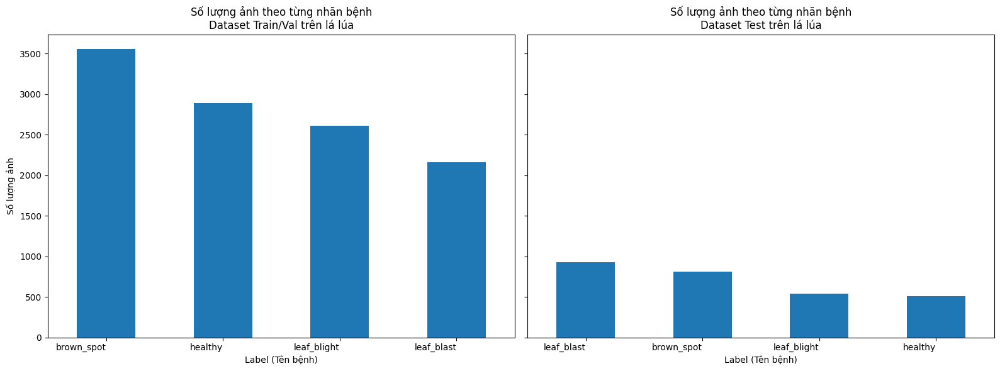

In [15]:
def plot_label_counts(df, name, ax):
    label_counts = df.groupby("label_name")["path"].count().sort_values(ascending=False)
    label_counts.plot(kind="bar", ax=ax)
    ax.set_title(f"Số lượng ảnh theo từng nhãn bệnh\n{name} trên lá lúa")
    ax.set_xlabel("Label (Tên bệnh)")
    ax.set_ylabel("Số lượng ảnh")
    ax.set_xticklabels(label_counts.index, rotation=0, ha="right")
fig, axes = plt.subplots(1, 2, figsize=(16,6), sharey=True)

plot_label_counts(df, "Dataset Train/Val", axes[0])
plot_label_counts(df_test, "Dataset Test", axes[1])

plt.tight_layout()
plt.show()

In [16]:
def visualize_by_source(df, num_samples=2, img_size=(128,128), ncols=4):
    sources = sorted(df['dataset_source'].dropna().unique())
    for source in sources:
        source_df = df[df['dataset_source'] == source]
        if len(source_df) == 0:
            continue

        unique_labels = sorted(source_df['label_name'].dropna().unique())
        if len(unique_labels) == 0:
            continue
        samples_all = []
        for label_name in unique_labels:
            label_imgs = source_df[source_df['label_name'] == label_name]['path'].values
            if len(label_imgs) == 0:
                continue
            samples = np.random.choice(label_imgs, 
                                       min(num_samples, len(label_imgs)), 
                                       replace=False)
            for img_path in samples:
                samples_all.append((img_path, label_name))

        if len(samples_all) == 0:
            continue

        nrows = math.ceil(len(samples_all) / ncols)
        plt.figure(figsize=(ncols*3, nrows*3))
        plt.suptitle(f"Samples data prepare train from {source}", fontsize=16)

        for idx, (img_path, label_name) in enumerate(samples_all):
            plt.subplot(nrows, ncols, idx+1)
            try:
                img = Image.open(img_path).convert("RGB")
                img = img.resize(img_size)
                plt.imshow(img)
                plt.title(label_name, fontsize=10)
                plt.axis('off')
            except Exception as e:
                plt.text(0.5, 0.5, "Error", ha='center', va='center')
                plt.axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


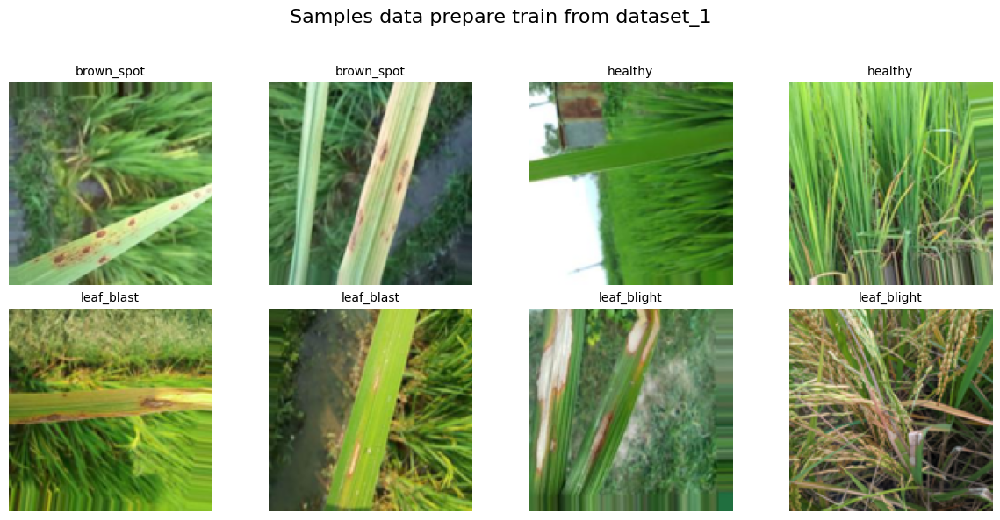

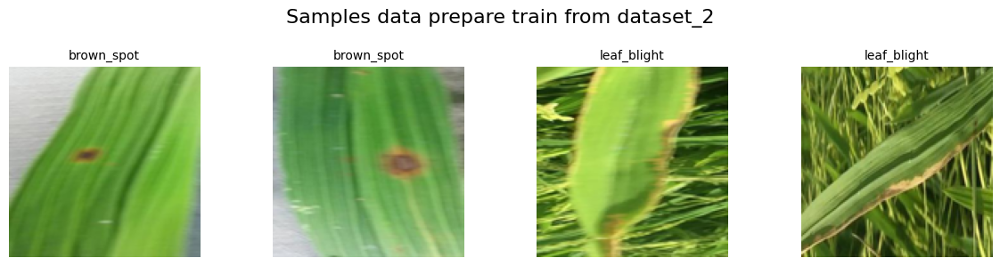

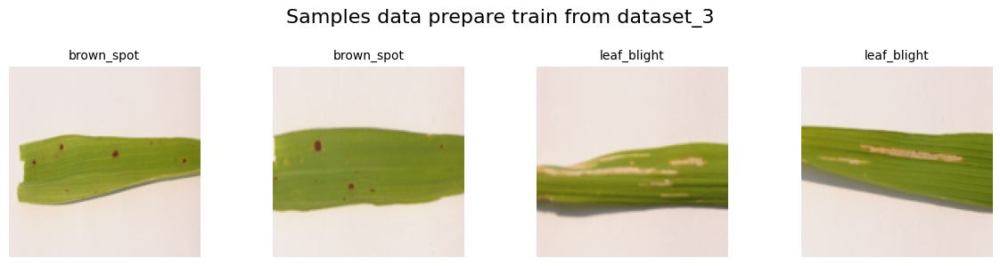

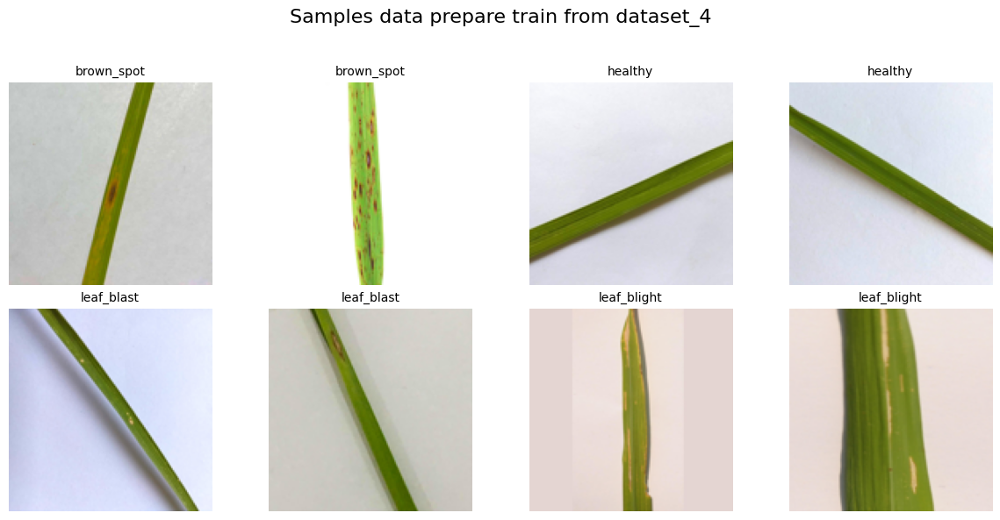

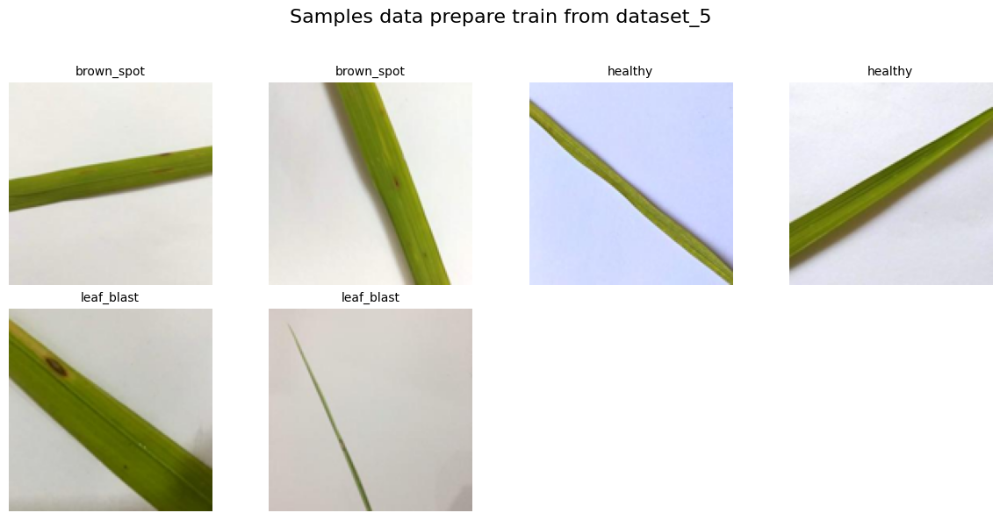

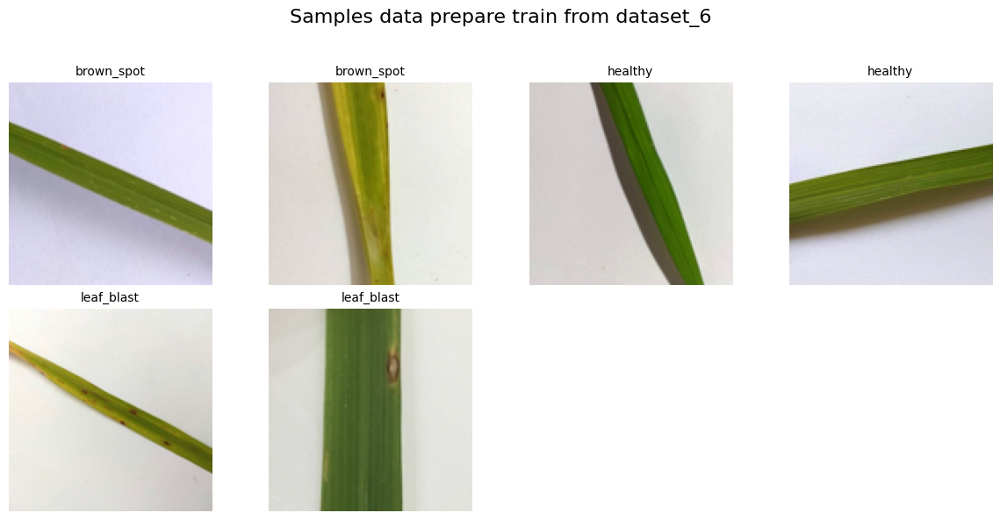

In [17]:
visualize_by_source(df)

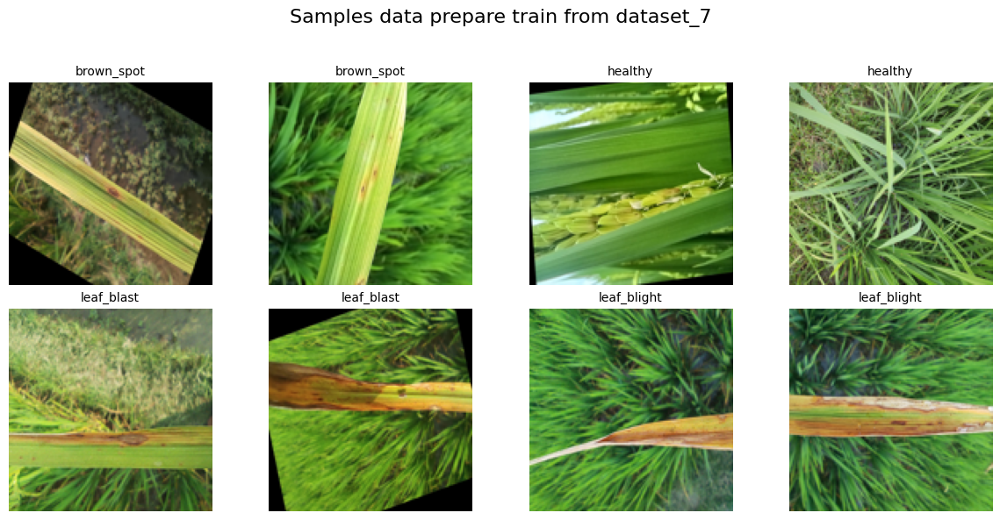

In [18]:
visualize_by_source(df_test)

In [19]:
df_stat = df.groupby(["dataset_source", "label_name"]).size().reset_index(name="Count")
pivot_df = df_stat.pivot_table(
    index="label_name", 
    columns="dataset_source", 
    values="Count", 
    aggfunc="sum",
    fill_value=0
)
pivot_df

dataset_source,dataset_1,dataset_2,dataset_3,dataset_4,dataset_5,dataset_6
label_name,,,,,,
brown_spot,646,1600,40,350,523,400
healthy,653,0,0,350,1488,400
leaf_blast,634,0,0,350,779,400
leaf_blight,632,1584,40,350,0,0


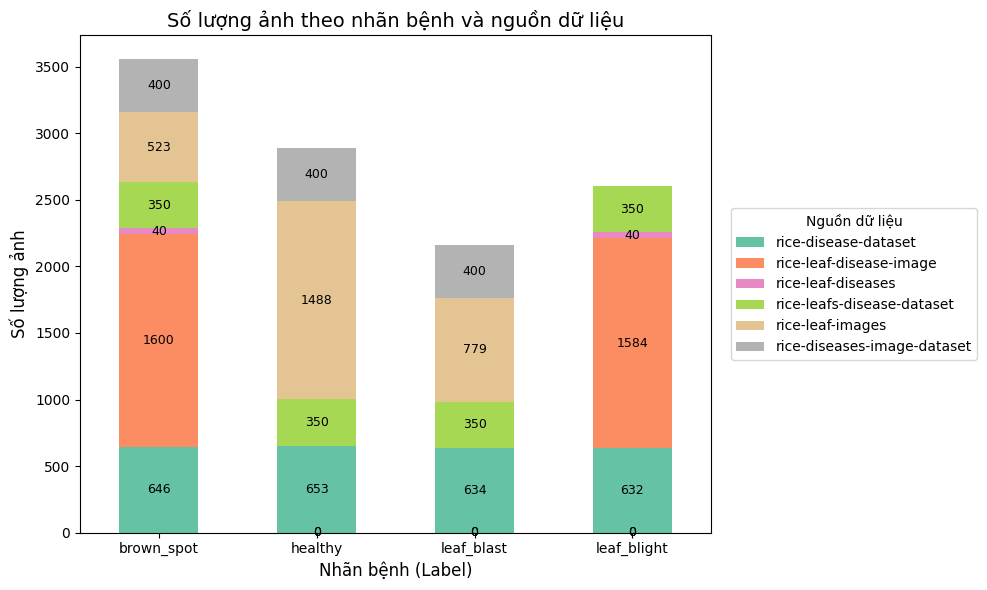

In [20]:
REVERSE_SOURCES = {v: k for k, v in DATASET_SOURCES.items()}
pivot_df_renamed = pivot_df.rename(columns=REVERSE_SOURCES)

ax = pivot_df_renamed.plot(
    kind="bar",
    stacked=True,
    figsize=(10, 6),
    colormap="Set2"
)

plt.title("Số lượng ảnh theo nhãn bệnh và nguồn dữ liệu", fontsize=14)
plt.xlabel("Nhãn bệnh (Label)", fontsize=12)
plt.ylabel("Số lượng ảnh", fontsize=12)

plt.legend(title="Nguồn dữ liệu", loc="center left", bbox_to_anchor=(1.02, 0.5))
plt.xticks(rotation=0)

for container in ax.containers:
    ax.bar_label(container, label_type="center", fontsize=9)

plt.tight_layout()
plt.show()


### Chia train/val/test

In [21]:
def split_df(df, seed=42, test_size=0.2, val_size=0.2):
    df_trainval, df_test = train_test_split(
        df,
        test_size=test_size,
        random_state=seed,
        stratify=df['label_id'] if 'label_id' in df.columns else None
    )
    df_train, df_val = train_test_split(
        df_trainval,
        test_size=val_size,
        random_state=seed,
        stratify=df_trainval['label_id'] if 'label_id' in df_trainval.columns else None
    )
    train_df = df_train.assign(split="train").reset_index(drop=True)
    val_df   = df_val.assign(split="val").reset_index(drop=True)
    test_df  = df_test.assign(split="test").reset_index(drop=True)

    return pd.concat([train_df, val_df, test_df], ignore_index=True)

def create_filtered_datasets(df, sources=None, test_size=0.2, val_size=0.2, seed=42):
    if sources is not None:
        filtered_df = df[df['dataset_source'].isin(sources)].copy()
    else:
        filtered_df = df.copy()

    if len(filtered_df) == 0:
        print(f"Warning: No data found for sources {sources}")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    split_df_result = split_df(filtered_df, seed=seed, test_size=test_size, val_size=val_size)

    train_df = split_df_result[split_df_result["split"] == "train"].reset_index(drop=True)
    val_df   = split_df_result[split_df_result["split"] == "val"].reset_index(drop=True)
    test_df  = split_df_result[split_df_result["split"] == "test"].reset_index(drop=True)

    source_str = "+".join(sources) if sources else "all_sources"
    print(f"Dataset sources: {source_str}")
    print(f"Split sizes: Train={len(train_df)}, Val={len(val_df)}, Test={len(test_df)}")

    return train_df, val_df, test_df

In [22]:
df_split = split_df(df, seed=42)
print(df_split.groupby(["split","label_id","label_name"]).size())

split  label_id  label_name 
test   0         brown_spot      712
       1         leaf_blast      433
       2         leaf_blight     521
       3         healthy         578
train  0         brown_spot     2278
       1         leaf_blast     1384
       2         leaf_blight    1668
       3         healthy        1850
val    0         brown_spot      569
       1         leaf_blast      346
       2         leaf_blight     417
       3         healthy         463
dtype: int64


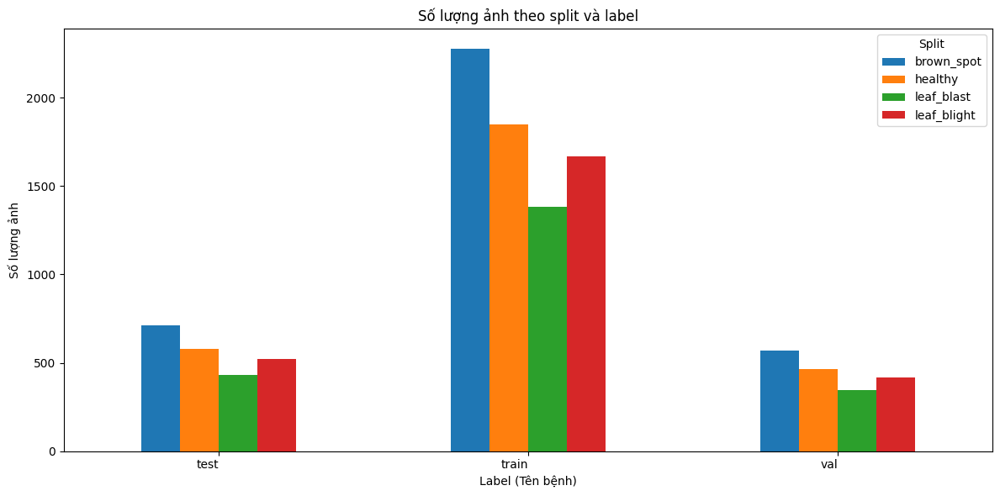

In [23]:
split_counts = df_split.groupby(["split", "label_name"])["path"].count().unstack(fill_value=0)
split_counts.plot(kind="bar", figsize=(12,6))
plt.title("Số lượng ảnh theo split và label")
plt.xlabel("Label (Tên bệnh)")
plt.ylabel("Số lượng ảnh")
plt.xticks(rotation=0, ha="right")
plt.legend(title="Split")
plt.tight_layout()
plt.show()

### Lưu CSV meta

In [24]:
out_meta = "/kaggle/working/riceleaf_meta.csv"
df_split.to_csv(out_meta, index=False)
print("lưu meta leafrice:", out_meta)

lưu meta leafrice: /kaggle/working/riceleaf_meta.csv


### Lưu output ảnh

In [25]:
DO_COPY = True
OUTROOT = "/kaggle/working/rice_dataset"

if DO_COPY:
    for _, row in df_split.iterrows():
        d = os.path.join(OUTROOT, row["split"], f'{row["label_id"]:02d}_{row["label_name"]}')
        os.makedirs(d, exist_ok=True)
        dst = os.path.join(d, os.path.basename(row["path"]))
        if not os.path.exists(dst):
            shutil.copy2(row["path"], dst)
    print("Đã copy ảnh vào:", OUTROOT)
else:
    print("Dùng trực tiếp path từ df")

Đã copy ảnh vào: /kaggle/working/rice_dataset


## Xử lý dữ liệu

### Đọc dữ liệu từ CSV meta

In [26]:
meta = pd.read_csv("/kaggle/working/riceleaf_meta.csv")

train_df = meta[meta["split"]=="train"]
val_df   = meta[meta["split"]=="val"]
test_df  = meta[meta["split"]=="test"]
print(train_df.shape, val_df.shape, test_df.shape)

(7180, 5) (1795, 5) (2244, 5)


#### CLAHE (Contrast Limited Adaptive Histogram Equalization) để tăng tương phản vùng lá lúa → giúp rõ vết bệnh hơn

| **Khía cạnh**           | **Lợi ích**                                                         | **Bất lợi**                                                                                   |
| ----------------------- | ------------------------------------------------------------------- | --------------------------------------------------------------------------------------------- |
| **Tương phản**          | Tăng cường chi tiết ở cả vùng sáng và tối, làm rõ vân lá, đốm bệnh. | Có thể làm **nhiễu** trở nên rõ ràng hơn ở vùng nền phẳng.                                    |
| **Ánh sáng môi trường** | Giảm sự khác biệt giữa ảnh chụp ở điều kiện ánh sáng khác nhau.     | Nếu ảnh gốc đã có ánh sáng tốt, CLAHE có thể gây **quá sắc nét**.                             |
| **Tính ổn định**        | Giúp model học feature rõ ràng hơn, đặc biệt với dataset nhỏ.       | Model có thể **overfit vào hình ảnh đã xử lý CLAHE**, kém robust với ảnh thực tế không xử lý. |

In [27]:
def apply_clahe_pil(pil_img):
    """Áp dụng CLAHE lên ảnh PIL"""
    img = np.array(pil_img.convert("RGB"))  # PIL -> numpy
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)  # sang không gian LAB
    
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl,a,b))
    
    enhanced = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
    return Image.fromarray(enhanced)


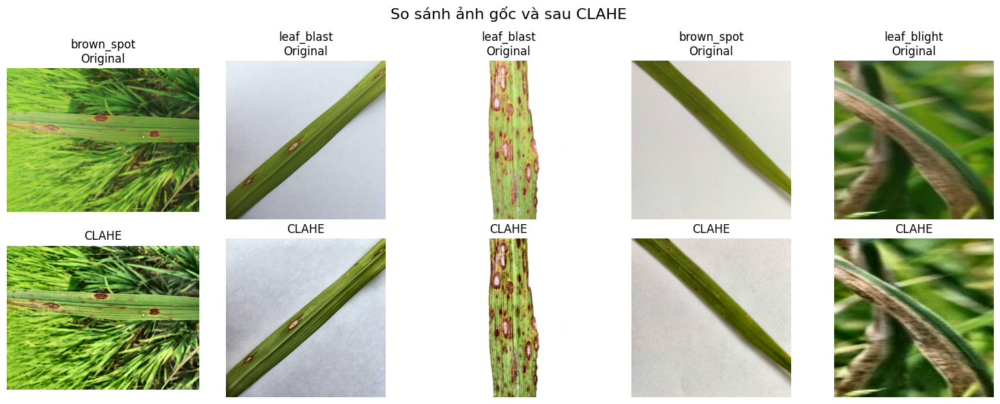

In [28]:
samples = train_df.sample(5, random_state=42)

plt.figure(figsize=(15, 6))
for i, (path, label) in enumerate(zip(samples['path'], samples['label_name'])):
    img = Image.open(path).convert("RGB")
    img_clahe = apply_clahe_pil(img)

    # Ảnh gốc
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(f"{label}\nOriginal")
    plt.axis('off')

    # Ảnh CLAHE
    plt.subplot(2, 5, i+6)
    plt.imshow(img_clahe)
    plt.title("CLAHE")
    plt.axis('off')

plt.suptitle("So sánh ảnh gốc và sau CLAHE", fontsize=16)
plt.tight_layout()
plt.show()

In [29]:
def save_clahe_in_batches(df, out_dir, batch_size=200):
    os.makedirs(out_dir, exist_ok=True)
    new_paths = []
    n = len(df)
    for i in tqdm(range(0, n, batch_size), desc=f"Processing {out_dir}"):
        batch = df.iloc[i:i+batch_size]
        for path, label in zip(batch['path'], batch['label_name']):
            img = Image.open(path).convert("RGB")
            img_clahe = apply_clahe_pil(img)

            # thư mục theo nhãn
            label_dir = os.path.join(out_dir, label)
            os.makedirs(label_dir, exist_ok=True)
            # Lưu ảnh CLAHE
            fname = os.path.basename(path)
            save_path = os.path.join(label_dir, fname)
            img_clahe.save(save_path)
            new_paths.append(save_path)
    return new_paths

In [30]:
train_df = meta[meta["split"]=="train"].copy()
print(train_df.shape, val_df.shape, test_df.shape)
train_df["clahe_path"] = save_clahe_in_batches(train_df, "/kaggle/working/clahe/train", batch_size=200)
train_df["path"] = train_df["clahe_path"]
train_df = train_df.drop(columns=["clahe_path"])

(7180, 5) (1795, 5) (2244, 5)


Processing /kaggle/working/clahe/train: 100%|██████████| 36/36 [04:16<00:00,  7.13s/it]


In [31]:
meta_merged = pd.concat([train_df, val_df, test_df], ignore_index=True)
meta_merged.to_csv("/kaggle/working/riceleaf_meta_merged.csv", index=False)
print(meta_merged.shape)

(11219, 5)


### Chuẩn hoá ảnh (Resize + Normalize)

In [32]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3), 
    transforms.RandomRotation(30),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),  
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.1),
    transforms.RandomApply([transforms.GaussianBlur(kernel_size=3)], p=0.2),  
    transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


### DataLoader

In [33]:
class RiceDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["path"]).convert("RGB")
        label = int(row["label_id"])   
        if self.transform:
            img = self.transform(img)
        return img, label

In [34]:
use_cuda = torch.cuda.is_available()

train_set = RiceDataset(train_df, transform=train_transform)
val_set   = RiceDataset(val_df, transform=val_test_transform)
test_set  = RiceDataset(test_df, transform=val_test_transform)

In [35]:
test_loader  = DataLoader(test_set, 
                          batch_size=32, 
                          shuffle=False, num_workers=2, 
                          pin_memory=use_cuda)
imgs, labels = next(iter(test_loader))
print("Batch shape:", imgs.shape)
print("Labels:", labels)
print("Min label:", labels.min().item(), "Max label:", labels.max().item())

Batch shape: torch.Size([32, 3, 224, 224])
Labels: tensor([3, 3, 0, 0, 0, 2, 0, 1, 2, 0, 0, 1, 2, 0, 2, 3, 2, 0, 0, 0, 3, 3, 3, 3,
        2, 1, 3, 0, 3, 1, 3, 3])
Min label: 0 Max label: 3


In [36]:
train_loader = DataLoader(
    train_set, batch_size=64, 
    shuffle=True,
    num_workers=4,            
    pin_memory=use_cuda,      
    persistent_workers=True,  
    prefetch_factor=2,       
)
val_loader = DataLoader(
    val_set, 
    batch_size=64,
    shuffle=False,
    num_workers=4, 
    pin_memory=use_cuda,
    persistent_workers=True, prefetch_factor=2,
)

In [37]:
imgs, labels = next(iter(train_loader))
print("Batch shape:", imgs.shape)
print("Labels:", labels)
print("Min label:", labels.min().item(), "Max label:", labels.max().item())

Batch shape: torch.Size([64, 3, 224, 224])
Labels: tensor([2, 3, 1, 2, 0, 2, 0, 0, 2, 2, 0, 3, 0, 2, 2, 3, 2, 2, 3, 1, 3, 3, 3, 2,
        0, 3, 0, 1, 0, 0, 0, 2, 2, 0, 1, 0, 3, 0, 1, 1, 1, 3, 1, 0, 3, 1, 1, 2,
        0, 2, 3, 3, 2, 3, 3, 0, 0, 1, 0, 2, 3, 2, 0, 0])
Min label: 0 Max label: 3


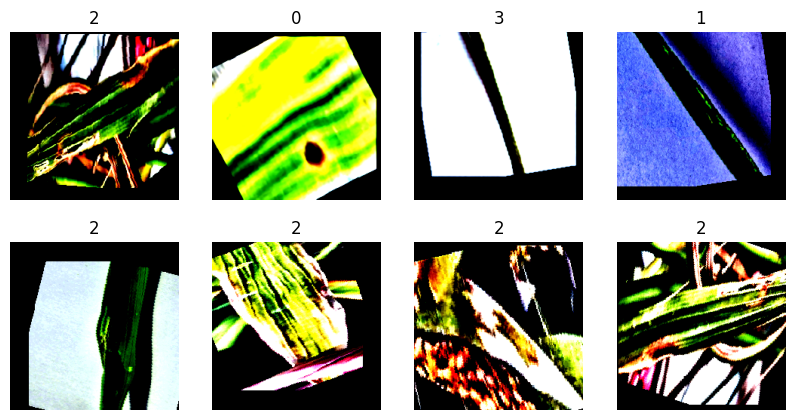

In [38]:
images, labels = next(iter(train_loader))
plt.figure(figsize=(10,5))
for i in range(8):
    plt.subplot(2,4,i+1)
    plt.imshow(images[i].permute(1,2,0).numpy())
    plt.title(labels[i].item())
    plt.axis("off")
plt.show()

In [39]:
label_counts = meta.groupby("label_name")["path"].count().sort_values(ascending=False)
print(label_counts)

label_name
brown_spot     3559
healthy        2891
leaf_blight    2606
leaf_blast     2163
Name: path, dtype: int64


## Xây dựng mô hình

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = meta["label_id"].nunique()
print(device)

cuda


### (1) CNN đơn giản (3 lớp Conv)

In [41]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2)
        )
        self.gap = nn.AdaptiveAvgPool2d((1,1))   # Global Avg Pool
        # self.fc = nn.Linear(128, num_classes)
        self.fc = nn.Sequential(
            nn.Dropout(0.2),               
            nn.Linear(128, num_classes)
        )
    def forward(self, x):
        x = self.conv(x)
        x = self.gap(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)


### (2) ResNet18 (pretrained)

In [42]:
from torchvision.models import resnet18, ResNet18_Weights

def build_resnet18(num_classes):
    weights = ResNet18_Weights.DEFAULT  # thay cho pretrained=True
    model = resnet18(weights=weights)
    # model.fc = nn.Linear(model.fc.in_features, num_classes)
    model.fc = nn.Sequential(
        nn.Dropout(0.2),
        nn.Linear(model.fc.in_features, num_classes)
    )
    return model

### (3) ResNet50 (pretrained)

In [43]:
from torchvision.models import resnet50, ResNet50_Weights

def build_resnet50(num_classes):
    weights = ResNet50_Weights.DEFAULT
    model = resnet50(weights=weights)
    # model.fc = nn.Linear(model.fc.in_features, num_classes)
    model.fc = nn.Sequential(
        nn.Dropout(0.2),
        nn.Linear(model.fc.in_features, num_classes)
    )
    return model

###  (4) EfficientNet-B0 (pretrained)

In [44]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

def build_efficientnet(num_classes):
    weights = EfficientNet_B0_Weights.DEFAULT
    model = efficientnet_b0(weights=weights)
    # model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    in_feat = model.classifier[1].in_features 
    model.classifier[1] = nn.Sequential(
        nn.Dropout(0.2),  
        nn.Linear(in_feat, num_classes)
    )
    return model

### (5) MobileNetV2 (pretrained)

In [45]:
from torchvision.models import mobilenet_v2, MobileNet_V2_Weights

def build_mobilenet(num_classes):
    weights = MobileNet_V2_Weights.DEFAULT
    model = mobilenet_v2(weights=weights)
    # model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    in_feat = model.classifier[1].in_features 
    model.classifier[1] = nn.Sequential(
        nn.Dropout(0.2),
        nn.Linear(in_feat, num_classes)
    )
    return model

### (6) Custom RiceLeafCNN - Specialized Architecture for Rice Disease

In [46]:
class RiceLeafCNN(nn.Module):
    """Custom architecture specialized for rice leaf disease with focus on efficiency"""
    def __init__(self, num_classes):
        super(RiceLeafCNN, self).__init__()
        
        # Feature extraction path with depth-wise separable convolutions
        self.features = nn.Sequential(
            # Standard first conv
            nn.Conv2d(3, 32, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            
            # Depthwise separable blocks for efficiency
            self._depthwise_block(32, 64, stride=1),
            self._depthwise_block(64, 128, stride=2),
            self._depthwise_block(128, 128, stride=1),
            self._depthwise_block(128, 256, stride=2),
            self._depthwise_block(256, 256, stride=1),
            self._depthwise_block(256, 512, stride=2),
            
            # Extra blocks with skip connections for disease texture patterns
            self._residual_block(512, 512),
            self._residual_block(512, 512),
        )
        
        # Disease-specific pattern enhancement with dilated convolutions
        self.pattern_enhancer = nn.Sequential(
            nn.Conv2d(512, 512, 3, padding=2, dilation=2, groups=512, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 1, bias=False),  # Pointwise
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
        )
        
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(512, num_classes)
        )
        
        # Initialize weights properly
        self._initialize_weights()
        
    def _depthwise_block(self, in_channels, out_channels, stride=1):
        return nn.Sequential(
            # Depthwise
            nn.Conv2d(in_channels, in_channels, 3, stride=stride, padding=1, groups=in_channels, bias=False),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True),
            # Pointwise
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
        
    def _residual_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1, groups=out_channels, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 1, bias=False),
            nn.BatchNorm2d(out_channels),
        )
        
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
                
    def forward(self, x):
        x = self.features(x)
        x = self.pattern_enhancer(x)
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        return self.classifier(x)

| Mô hình             | Lõi kiến trúc                                                               | Đặc trưng chính                    | Điểm mạnh                                          | Hạn chế                                                 | Khi nên dùng                                                  |
| ------------------- | --------------------------------------------------------------------------- | ---------------------------------- | -------------------------------------------------- | ------------------------------------------------------- | ------------------------------------------------------------- |
| **SimpleCNN**       | 3× (Conv+ReLU+MaxPool) → GAP → FC                                           | Cực đơn giản, dễ debug             | Nhanh, ít tham số, baseline tốt                    | Biểu đạt hạn chế trên mẫu phức tạp                      | Kiểm thử pipeline, dataset rất nhỏ                            |
| **RiceLeafCNN**     | Depthwise-separable + (khối “residual” tùy chỉnh) + dilated depthwise + GAP | Tối ưu họa tiết lá, nhẹ            | Hiệu quả FLOPs/tham số tốt; nhấn mạnh pattern bệnh | “Residual” trong code chưa có skip; cần tinh chỉnh thêm | Bài toán lá/bệnh; cần mô hình gọn nhưng giàu đặc trưng cục bộ |
| **ResNet-18**       | Residual basic blocks (2×3×3)                                               | Skip connection giúp train ổn định | Triển khai dễ, ổn định, nhanh hơn ResNet-50        | Chính xác kém hơn mạng sâu hơn                          | Baseline chắc, inference nhanh                                |
| **ResNet-50**       | Residual **bottleneck** (1×1–3×3–1×1)                                       | Sâu hơn, mạnh hơn R18              | Chính xác tốt, phổ biến                            | Nặng hơn MobileNet/EffNet-B0                            | Khi cần thêm accuracy nhưng vẫn muốn kiến trúc “chuẩn”        |
| **EfficientNet-B0** | **MBConv + SE** + compound scaling                                          | Rất hiệu quả params/FLOPs          | Accuracy cao với chi phí thấp                      | Cấu trúc phức tạp hơn; nhạy preprocessing               | Muốn tối ưu **accuracy/compute**                              |
| **MobileNetV2**     | **Inverted residual + linear bottleneck**                                   | Cực nhẹ, depthwise separable       | Rất nhanh/nhẹ (edge)                               | Accuracy < EffNet-B0/ResNet-50                          | Thiết bị giới hạn, realtime                                   |


## Train

### Kiểm tra máy tính

In [47]:
# Chọn thiết bị: xác định dùng CPU hay GPU (CUDA).
# Tạo AMP context: bật autocast nếu có CUDA, ngược lại dùng nullcontext().
# Tạo GradScaler: chọn API mới/cũ và bật tắt theo tình trạng CUDA.

def setup_amp():
    try:
        from torch.amp import GradScaler, autocast
        NEW_AMP = True
    except Exception:
        from torch.cuda.amp import GradScaler, autocast
        NEW_AMP = False
    use_cuda = torch.cuda.is_available()
    device = torch.device("cuda" if use_cuda else "cpu")
    if not use_cuda:
        amp_ctx = nullcontext()
    else:
        amp_ctx = autocast(device_type="cuda", enabled=True) if NEW_AMP else autocast(enabled=True)
    if NEW_AMP:
        scaler = GradScaler(device="cuda" if use_cuda else "cpu", enabled=use_cuda)
    else:
        scaler = GradScaler(enabled=use_cuda)
    return device, amp_ctx, scaler

In [48]:
class EarlyStopping:
    def __init__(self, patience=5, mode="min", min_delta=0.0):
        self.patience = patience
        self.mode = mode
        self.min_delta = min_delta
        self.best = None
        self.counter = 0
        self.should_stop = False

    def step(self, current):
        if self.best is None:
            self.best = current
            return False

        improvement = (current < self.best - self.min_delta) if self.mode == "min" else (current > self.best + self.min_delta)

        if improvement:
            self.best = current
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.should_stop = True
        return self.should_stop

In [49]:
torch.backends.cudnn.benchmark = bool(torch.cuda.is_available())
def prepare_model(model, lr, monitor):
    criterion = nn.CrossEntropyLoss()
    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = "min" if monitor=="val_loss" else "max", factor=0.5, patience=2)
    return model, scheduler, optimizer, criterion

In [50]:
def train_model(model, train_loader, val_loader, epochs=30, lr=1e-4, device=None, ckpt_path="/kaggle/working/best.pth", es_patience=5, monitor="val_loss"):
    dev, amp_ctx, scaler = setup_amp()
    if device is None:   
        device = dev

    model, scheduler, optimizer, criterion = prepare_model(model, lr, monitor)
    es = EarlyStopping(patience=es_patience, mode=("min" if monitor=="val_loss" else "max"), min_delta=0.0)

    best_metric = float("inf") if monitor=="val_loss" else -float("inf")
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

    for epoch in range(1, epochs+1):
        # TRAIN 
        model.train()
        running_loss, running_correct, running_total = 0.0, 0, 0
        pbar = tqdm(train_loader, desc=f"Train E{epoch}/{epochs}")

        for imgs, labels in pbar:
            imgs   = imgs.to(device, non_blocking=True)
            labels = labels.long().to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)
            with amp_ctx:   
                outputs = model(imgs)
                loss = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            running_loss += float(loss.item()) * imgs.size(0)
            preds = outputs.argmax(1)
            running_correct += (preds == labels).sum().item()
            running_total += labels.size(0)
            pbar.set_postfix(loss=float(loss.item()))

        train_loss = running_loss / max(1, running_total)
        train_acc  = running_correct / max(1, running_total)
        
        # VALID 
        model.eval()
        val_loss_sum, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for imgs, labels in tqdm(val_loader, desc=f"Valid E{epoch}/{epochs}"):
                imgs   = imgs.to(device, non_blocking=True)
                labels = labels.long().to(device, non_blocking=True)
                with amp_ctx:  
                    outputs = model(imgs)
                    loss = criterion(outputs, labels)
                val_loss_sum += float(loss.item()) * imgs.size(0)
                val_correct  += (outputs.argmax(1) == labels).sum().item()
                val_total    += labels.size(0)

        val_loss = val_loss_sum / max(1, val_total)
        val_acc  = val_correct / max(1, val_total)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)
        print(f"Epoch {epoch}/{epochs} | Train Loss {train_loss:.4f} Acc {train_acc:.4f} Val Loss {val_loss:.4f} Acc {val_acc:.4f}")

        monitored_value = val_loss if monitor == "val_loss" else val_acc
        scheduler.step(monitored_value)

        is_better = (monitored_value < best_metric) if monitor=="val_loss" else (monitored_value > best_metric)
        if is_better:
            best_metric = monitored_value
            torch.save(model.state_dict(), ckpt_path)
            print(f"Saved BEST to {ckpt_path} (best {monitor}: {best_metric:.4f})")
        if es.step(monitored_value):
            print(f"Early stopping at epoch {epoch} (no improvement on {monitor})")
            break

    print(f"Best {monitor}: {best_metric:.4f}")
    return history, ckpt_path

In [51]:
@torch.no_grad()
def evaluate_on_loader(model, loader, device):
    model.eval()
    all_preds, all_labels = [], []
    for imgs, labels in loader:
        imgs   = imgs.to(device, non_blocking=True)
        labels = labels.long().to(device, non_blocking=True)
        logits = model(imgs)
        preds  = logits.argmax(1)
        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())
    y_pred  = np.concatenate(all_preds)
    y_true  = np.concatenate(all_labels)
    acc     = accuracy_score(y_true, y_pred)
    p, r, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="macro", zero_division=0)
    return {"test_acc": acc, "precision": p, "recall": r, "f1": f1, "confusion_matrix": confusion_matrix(y_true, y_pred)}

def count_params_m(model):
    return sum(p.numel() for p in model.parameters()) / 1e6

@torch.no_grad()
def measure_latency_ms(model, device, input_size=(1,3,224,224), warmup=10, runs=30):
    model.eval()
    x = torch.randn(*input_size, device=device)
    # warm-up
    for _ in range(warmup):
        _ = model(x)
    # measure
    torch.cuda.synchronize() if device.type == "cuda" else None
    t0 = time.time()
    for _ in range(runs):
        _ = model(x)
    torch.cuda.synchronize() if device.type == "cuda" else None
    dt = (time.time() - t0) / runs
    return dt * 1000.0  


In [52]:
def plot_history(history, title="Training Curve", show=True, save_path=None, monitor="val_loss"):
    epochs = range(1, len(history["train_loss"]) + 1)
    plt.figure(figsize=(12,5))

    # Tìm best point theo monitor
    if monitor == "val_loss":
        best_epoch = int(np.argmin(history["val_loss"])) + 1
        best_value = min(history["val_loss"])
        label_text = f"Best Val Loss={best_value:.4f} (Epoch {best_epoch})"
    else:  # val_acc
        best_epoch = int(np.argmax(history["val_acc"])) + 1
        best_value = max(history["val_acc"])
        label_text = f"Best Val Acc={best_value:.4f} (Epoch {best_epoch})"

    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(epochs, history["train_acc"], label="Train Acc")
    plt.plot(epochs, history["val_acc"], label="Val Acc")
    plt.scatter(best_epoch, history["val_acc"][best_epoch-1], color="red", marker="o", s=80, label="Best Point")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()

    # Loss
    plt.subplot(1,2,2)
    plt.plot(epochs, history["train_loss"], label="Train Loss")
    plt.plot(epochs, history["val_loss"], label="Val Loss")
    plt.scatter(best_epoch, history["val_loss"][best_epoch-1], color="red", marker="o", s=80, label="Best Point")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss\n{label_text}")
    plt.legend()

    plt.tight_layout()
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path)
    if show:
        plt.show()

In [53]:
def comprehensive_evaluation(models_dict, dataset_combinations, device, epochs=10):
    results = []
    all_histories = {}
    
    for sources in dataset_combinations:
        source_name = "+".join(sources) if sources else "all_sources"
        print(f"\n===== EVALUATING ON {source_name} =====")
        
        # Create datasets for this combination
        train_df_filtered, val_df_filtered, test_df_filtered = create_filtered_datasets(meta, sources=sources)
        
        if len(train_df_filtered) == 0:
            print(f"Skipping {source_name} - no data found")
            continue
        
        # Create dataloaders
        train_set = RiceDataset(train_df_filtered, transform=train_transform)
        val_set = RiceDataset(val_df_filtered, transform=val_test_transform)
        test_set = RiceDataset(test_df_filtered, transform=val_test_transform)
        
        train_loader = DataLoader(train_set, batch_size=128, shuffle=True, num_workers=2)
        val_loader = DataLoader(val_set, batch_size=128, shuffle=False, num_workers=2)
        test_loader = DataLoader(test_set, batch_size=128, shuffle=False, num_workers=2)
        
        for model_name, model_constructor in models_dict.items():
            print(f"\nTraining {model_name} on {source_name}")
            
            # Initialize model
            model = model_constructor().to(device)
            
            # Train model
            ckpt_path = f"/kaggle/working/{model_name}_{source_name}_best.pth"
            history, _ = train_model(
                model, train_loader, val_loader,
                epochs=epochs, lr=1e-4, device=device,
                ckpt_path=ckpt_path, 
                es_patience=5, monitor="val_loss"
            )
            
            all_histories[f"{model_name}_{source_name}"] = history
            plot_history(history, title=f"{model_name} on {source_name}", save_path=f"/kaggle/working/modeltraining/{model_name}_{source_name}_curve.png", monitor="val_acc")
            # Load best weights and evaluate
            model.load_state_dict(torch.load(ckpt_path, map_location=device))
            test_metrics = evaluate_on_loader(model, test_loader, device)
            
            # Model metrics
            params_m = count_params_m(model)
            latency_ms = measure_latency_ms(model, device)
            fps = 1000 / latency_ms
            
            # Save results
            results.append({
                "Model": model_name,
                "Dataset": source_name,
                "Test Acc": test_metrics["test_acc"],
                "Precision": test_metrics["precision"],
                "Recall": test_metrics["recall"],
                "F1": test_metrics["f1"],
                "Params (M)": params_m,
                "Latency (ms)": latency_ms,
                "FPS": fps,
                "Checkpoint": ckpt_path
            })
            
            # Clean up
            del model
            torch.cuda.empty_cache()
            gc.collect()
    
    return pd.DataFrame(results), all_histories


===== EVALUATING ON dataset_1 =====
Dataset sources: dataset_1
Split sizes: Train=1641, Val=411, Test=513

Training SimpleCNN on dataset_1


Valid E1/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 1/20 | Train Loss 1.3832 Acc 0.2693 Val Loss 1.3756 Acc 0.2774
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.3756)


Valid E2/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 2/20 | Train Loss 1.3685 Acc 0.3632 Val Loss 1.3605 Acc 0.3212
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.3605)


Valid E3/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 3/20 | Train Loss 1.3557 Acc 0.3991 Val Loss 1.3417 Acc 0.3552
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.3417)


Valid E4/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 4/20 | Train Loss 1.3329 Acc 0.4254 Val Loss 1.3192 Acc 0.3990
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.3192)


Valid E5/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 5/20 | Train Loss 1.3036 Acc 0.4186 Val Loss 1.2983 Acc 0.5158
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2983)


Valid E6/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 6/20 | Train Loss 1.2777 Acc 0.4333 Val Loss 1.2833 Acc 0.3869
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2833)


Valid E7/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 7/20 | Train Loss 1.2538 Acc 0.4461 Val Loss 1.2714 Acc 0.4282
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2714)


Valid E8/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 8/20 | Train Loss 1.2364 Acc 0.4394 Val Loss 1.2662 Acc 0.4185
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2662)


Valid E9/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 9/20 | Train Loss 1.2401 Acc 0.4327 Val Loss 1.2865 Acc 0.3917


Valid E10/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 10/20 | Train Loss 1.2290 Acc 0.4449 Val Loss 1.2565 Acc 0.4380
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2565)


Valid E11/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 11/20 | Train Loss 1.2188 Acc 0.4644 Val Loss 1.2622 Acc 0.4112


Valid E12/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 12/20 | Train Loss 1.2307 Acc 0.4491 Val Loss 1.2640 Acc 0.4234


Valid E13/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 13/20 | Train Loss 1.2114 Acc 0.4601 Val Loss 1.2529 Acc 0.4112
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2529)


Valid E14/20: 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]


Epoch 14/20 | Train Loss 1.2309 Acc 0.4522 Val Loss 1.2483 Acc 0.4453
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2483)


Valid E15/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 15/20 | Train Loss 1.2036 Acc 0.4619 Val Loss 1.2365 Acc 0.4307
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2365)


Valid E16/20: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


Epoch 16/20 | Train Loss 1.2200 Acc 0.4534 Val Loss 1.2662 Acc 0.3966


Valid E17/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 17/20 | Train Loss 1.2070 Acc 0.4601 Val Loss 1.2321 Acc 0.4307
Saved BEST to /kaggle/working/SimpleCNN_dataset_1_best.pth (best val_loss: 1.2321)


Valid E18/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 18/20 | Train Loss 1.2179 Acc 0.4668 Val Loss 1.2400 Acc 0.4088


Valid E19/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 19/20 | Train Loss 1.1913 Acc 0.4650 Val Loss 1.2338 Acc 0.4307


Valid E20/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 20/20 | Train Loss 1.1769 Acc 0.4839 Val Loss 1.2395 Acc 0.4234
Best val_loss: 1.2321


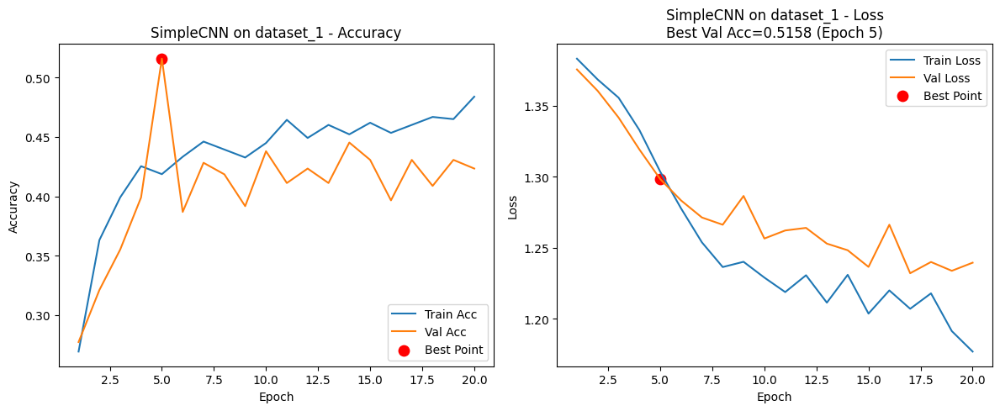


Training RiceLeafCNN on dataset_1


Valid E1/20: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


Epoch 1/20 | Train Loss 1.3840 Acc 0.2761 Val Loss 1.3873 Acc 0.2457
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.3873)


Valid E2/20: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


Epoch 2/20 | Train Loss 1.3597 Acc 0.3370 Val Loss 1.3911 Acc 0.2530


Valid E3/20: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


Epoch 3/20 | Train Loss 1.3353 Acc 0.3577 Val Loss 1.3972 Acc 0.2530


Valid E4/20: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


Epoch 4/20 | Train Loss 1.2676 Acc 0.4418 Val Loss 1.4616 Acc 0.2555


Valid E5/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 5/20 | Train Loss 1.2131 Acc 0.4680 Val Loss 1.6632 Acc 0.2579


Valid E6/20: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


Epoch 6/20 | Train Loss 1.1757 Acc 0.4857 Val Loss 1.2824 Acc 0.3698
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.2824)


Valid E7/20: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


Epoch 7/20 | Train Loss 1.1648 Acc 0.4832 Val Loss 1.1428 Acc 0.4866
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.1428)


Valid E8/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 8/20 | Train Loss 1.1647 Acc 0.4930 Val Loss 1.1371 Acc 0.5012
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.1371)


Valid E9/20: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


Epoch 9/20 | Train Loss 1.1312 Acc 0.5052 Val Loss 1.0978 Acc 0.5523
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.0978)


Valid E10/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 10/20 | Train Loss 1.1206 Acc 0.5265 Val Loss 1.0831 Acc 0.5523
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.0831)


Valid E11/20: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


Epoch 11/20 | Train Loss 1.1048 Acc 0.5235 Val Loss 1.0776 Acc 0.5572
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.0776)


Valid E12/20: 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]


Epoch 12/20 | Train Loss 1.0959 Acc 0.5296 Val Loss 1.0640 Acc 0.5669
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.0640)


Valid E13/20: 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]


Epoch 13/20 | Train Loss 1.0902 Acc 0.5363 Val Loss 1.0654 Acc 0.5572


Valid E14/20: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


Epoch 14/20 | Train Loss 1.0731 Acc 0.5417 Val Loss 1.0719 Acc 0.5572


Valid E15/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 15/20 | Train Loss 1.0613 Acc 0.5551 Val Loss 1.0003 Acc 0.6034
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 1.0003)


Valid E16/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 16/20 | Train Loss 1.0544 Acc 0.5649 Val Loss 1.0495 Acc 0.5693


Valid E17/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 17/20 | Train Loss 1.0351 Acc 0.5801 Val Loss 0.9679 Acc 0.6253
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 0.9679)


Valid E18/20: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


Epoch 18/20 | Train Loss 1.0422 Acc 0.5612 Val Loss 0.9656 Acc 0.6058
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 0.9656)


Valid E19/20: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


Epoch 19/20 | Train Loss 1.0095 Acc 0.5862 Val Loss 0.9311 Acc 0.6180
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 0.9311)


Valid E20/20: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


Epoch 20/20 | Train Loss 1.0208 Acc 0.5734 Val Loss 0.9132 Acc 0.6204
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1_best.pth (best val_loss: 0.9132)
Best val_loss: 0.9132


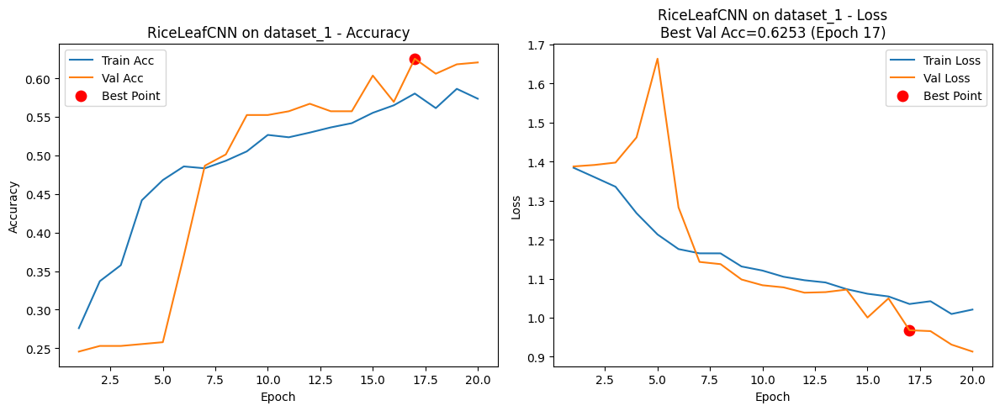


Training ResNet18 on dataset_1


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 212MB/s]
Valid E1/20: 100%|██████████| 4/4 [00:03<00:00,  1.01it/s]


Epoch 1/20 | Train Loss 0.9669 Acc 0.6204 Val Loss 0.6521 Acc 0.7372
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.6521)


Valid E2/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 2/20 | Train Loss 0.4981 Acc 0.8184 Val Loss 0.3457 Acc 0.8637
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.3457)


Valid E3/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 3/20 | Train Loss 0.3293 Acc 0.8775 Val Loss 0.2276 Acc 0.9075
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.2276)


Valid E4/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 4/20 | Train Loss 0.2319 Acc 0.9263 Val Loss 0.1720 Acc 0.9197
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.1720)


Valid E5/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 5/20 | Train Loss 0.1835 Acc 0.9360 Val Loss 0.1403 Acc 0.9465
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.1403)


Valid E6/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 6/20 | Train Loss 0.1418 Acc 0.9512 Val Loss 0.1049 Acc 0.9586
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.1049)


Valid E7/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 7/20 | Train Loss 0.0988 Acc 0.9665 Val Loss 0.0960 Acc 0.9611
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.0960)


Valid E8/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 8/20 | Train Loss 0.0952 Acc 0.9689 Val Loss 0.0972 Acc 0.9635


Valid E9/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 9/20 | Train Loss 0.0758 Acc 0.9775 Val Loss 0.0875 Acc 0.9732
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.0875)


Valid E10/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 10/20 | Train Loss 0.0676 Acc 0.9781 Val Loss 0.0663 Acc 0.9830
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.0663)


Valid E11/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 11/20 | Train Loss 0.0608 Acc 0.9817 Val Loss 0.0664 Acc 0.9830


Valid E12/20: 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]


Epoch 12/20 | Train Loss 0.0707 Acc 0.9756 Val Loss 0.0877 Acc 0.9805


Valid E13/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 13/20 | Train Loss 0.0486 Acc 0.9878 Val Loss 0.0645 Acc 0.9854
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.0645)


Valid E14/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 14/20 | Train Loss 0.0625 Acc 0.9799 Val Loss 0.0806 Acc 0.9757


Valid E15/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 15/20 | Train Loss 0.0538 Acc 0.9817 Val Loss 0.0778 Acc 0.9757


Valid E16/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 16/20 | Train Loss 0.0492 Acc 0.9842 Val Loss 0.0609 Acc 0.9830
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.0609)


Valid E17/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 17/20 | Train Loss 0.0460 Acc 0.9860 Val Loss 0.0799 Acc 0.9805


Valid E18/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 18/20 | Train Loss 0.0369 Acc 0.9866 Val Loss 0.0618 Acc 0.9805


Valid E19/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 19/20 | Train Loss 0.0459 Acc 0.9842 Val Loss 0.0433 Acc 0.9854
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.0433)


Valid E20/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 20/20 | Train Loss 0.0297 Acc 0.9933 Val Loss 0.0415 Acc 0.9854
Saved BEST to /kaggle/working/ResNet18_dataset_1_best.pth (best val_loss: 0.0415)
Best val_loss: 0.0415


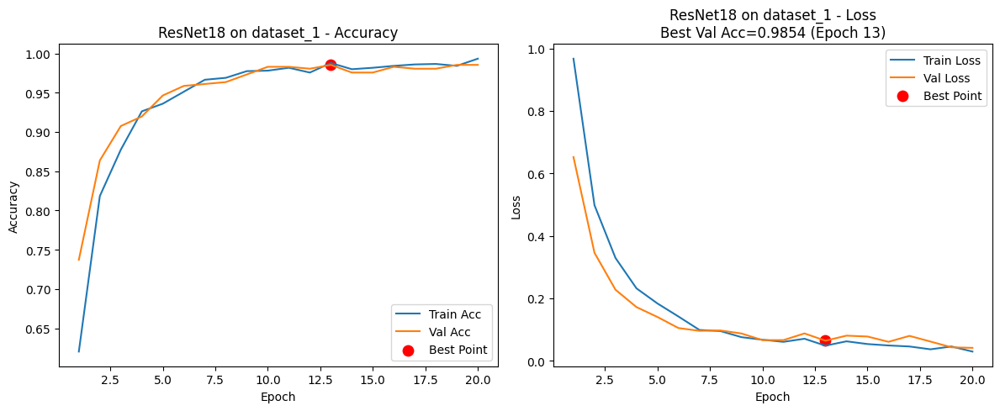


Training ResNet50 on dataset_1


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 221MB/s]
Valid E1/20: 100%|██████████| 4/4 [00:04<00:00,  1.09s/it]


Epoch 1/20 | Train Loss 1.2515 Acc 0.5155 Val Loss 0.9936 Acc 0.7226
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.9936)


Valid E2/20: 100%|██████████| 4/4 [00:03<00:00,  1.01it/s]


Epoch 2/20 | Train Loss 0.8038 Acc 0.7879 Val Loss 0.4918 Acc 0.8200
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.4918)


Valid E3/20: 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]


Epoch 3/20 | Train Loss 0.3957 Acc 0.8726 Val Loss 0.2817 Acc 0.8735
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.2817)


Valid E4/20: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


Epoch 4/20 | Train Loss 0.2304 Acc 0.9317 Val Loss 0.2493 Acc 0.9221
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.2493)


Valid E5/20: 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]


Epoch 5/20 | Train Loss 0.1508 Acc 0.9482 Val Loss 0.1581 Acc 0.9343
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.1581)


Valid E6/20: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


Epoch 6/20 | Train Loss 0.1047 Acc 0.9628 Val Loss 0.1131 Acc 0.9586
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.1131)


Valid E7/20: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s]


Epoch 7/20 | Train Loss 0.1020 Acc 0.9671 Val Loss 0.1136 Acc 0.9562


Valid E8/20: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s]


Epoch 8/20 | Train Loss 0.0796 Acc 0.9768 Val Loss 0.0846 Acc 0.9684
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.0846)


Valid E9/20: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


Epoch 9/20 | Train Loss 0.0584 Acc 0.9787 Val Loss 0.0828 Acc 0.9708
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.0828)


Valid E10/20: 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]


Epoch 10/20 | Train Loss 0.0488 Acc 0.9848 Val Loss 0.0702 Acc 0.9781
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.0702)


Valid E11/20: 100%|██████████| 4/4 [00:04<00:00,  1.00s/it]


Epoch 11/20 | Train Loss 0.0488 Acc 0.9854 Val Loss 0.0579 Acc 0.9805
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.0579)


Valid E12/20: 100%|██████████| 4/4 [00:04<00:00,  1.02s/it]


Epoch 12/20 | Train Loss 0.0324 Acc 0.9921 Val Loss 0.0580 Acc 0.9830


Valid E13/20: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s]


Epoch 13/20 | Train Loss 0.0394 Acc 0.9854 Val Loss 0.0551 Acc 0.9805
Saved BEST to /kaggle/working/ResNet50_dataset_1_best.pth (best val_loss: 0.0551)


Valid E14/20: 100%|██████████| 4/4 [00:04<00:00,  1.00s/it]


Epoch 14/20 | Train Loss 0.0403 Acc 0.9829 Val Loss 0.0755 Acc 0.9805


Valid E15/20: 100%|██████████| 4/4 [00:03<00:00,  1.03it/s]


Epoch 15/20 | Train Loss 0.0340 Acc 0.9878 Val Loss 0.0720 Acc 0.9781


Valid E16/20: 100%|██████████| 4/4 [00:04<00:00,  1.08s/it]


Epoch 16/20 | Train Loss 0.0333 Acc 0.9902 Val Loss 0.0840 Acc 0.9708


Valid E17/20: 100%|██████████| 4/4 [00:03<00:00,  1.01it/s]


Epoch 17/20 | Train Loss 0.0255 Acc 0.9933 Val Loss 0.0742 Acc 0.9757


Valid E18/20: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s]


Epoch 18/20 | Train Loss 0.0180 Acc 0.9945 Val Loss 0.0555 Acc 0.9830
Early stopping at epoch 18 (no improvement on val_loss)
Best val_loss: 0.0551


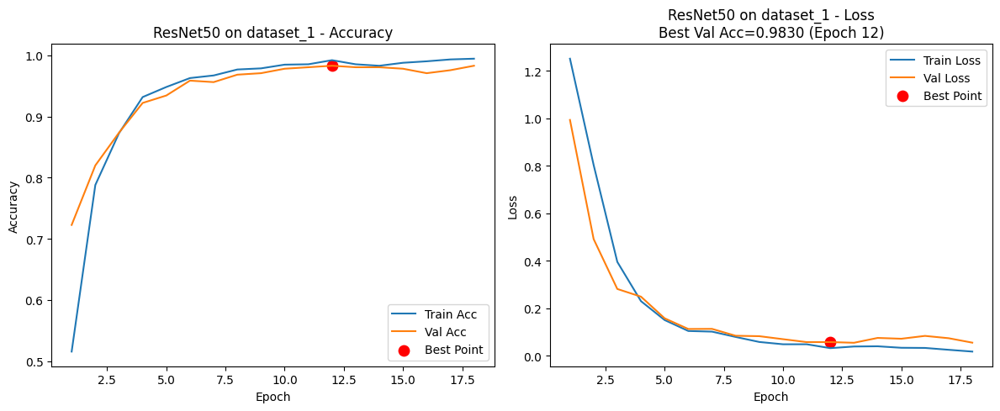

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth



Training EfficientNetB0 on dataset_1


100%|██████████| 20.5M/20.5M [00:00<00:00, 157MB/s]
Valid E1/20: 100%|██████████| 4/4 [00:03<00:00,  1.03it/s]


Epoch 1/20 | Train Loss 1.3099 Acc 0.3973 Val Loss 1.1740 Acc 0.5620
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 1.1740)


Valid E2/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 2/20 | Train Loss 1.0573 Acc 0.6667 Val Loss 0.9057 Acc 0.6886
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.9057)


Valid E3/20: 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]


Epoch 3/20 | Train Loss 0.8212 Acc 0.7227 Val Loss 0.7026 Acc 0.7421
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.7026)


Valid E4/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 4/20 | Train Loss 0.6299 Acc 0.7770 Val Loss 0.5147 Acc 0.7932
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.5147)


Valid E5/20: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


Epoch 5/20 | Train Loss 0.4810 Acc 0.8288 Val Loss 0.3797 Acc 0.8394
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.3797)


Valid E6/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 6/20 | Train Loss 0.3664 Acc 0.8824 Val Loss 0.3026 Acc 0.8783
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.3026)


Valid E7/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 7/20 | Train Loss 0.2958 Acc 0.8940 Val Loss 0.2437 Acc 0.9075
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.2437)


Valid E8/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 8/20 | Train Loss 0.2379 Acc 0.9177 Val Loss 0.2070 Acc 0.9148
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.2070)


Valid E9/20: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


Epoch 9/20 | Train Loss 0.1963 Acc 0.9372 Val Loss 0.1643 Acc 0.9343
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.1643)


Valid E10/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 10/20 | Train Loss 0.1621 Acc 0.9470 Val Loss 0.1440 Acc 0.9465
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.1440)


Valid E11/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 11/20 | Train Loss 0.1258 Acc 0.9598 Val Loss 0.1337 Acc 0.9538
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.1337)


Valid E12/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 12/20 | Train Loss 0.1163 Acc 0.9622 Val Loss 0.1184 Acc 0.9611
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.1184)


Valid E13/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 13/20 | Train Loss 0.1088 Acc 0.9634 Val Loss 0.1033 Acc 0.9611
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.1033)


Valid E14/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 14/20 | Train Loss 0.0964 Acc 0.9701 Val Loss 0.0987 Acc 0.9659
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.0987)


Valid E15/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 15/20 | Train Loss 0.0813 Acc 0.9744 Val Loss 0.0937 Acc 0.9659
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.0937)


Valid E16/20: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


Epoch 16/20 | Train Loss 0.0749 Acc 0.9805 Val Loss 0.0925 Acc 0.9611
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.0925)


Valid E17/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 17/20 | Train Loss 0.0598 Acc 0.9793 Val Loss 0.1008 Acc 0.9684


Valid E18/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 18/20 | Train Loss 0.0591 Acc 0.9811 Val Loss 0.0835 Acc 0.9732
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.0835)


Valid E19/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 19/20 | Train Loss 0.0565 Acc 0.9835 Val Loss 0.0812 Acc 0.9732
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1_best.pth (best val_loss: 0.0812)


Valid E20/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 20/20 | Train Loss 0.0490 Acc 0.9884 Val Loss 0.0917 Acc 0.9708
Best val_loss: 0.0812


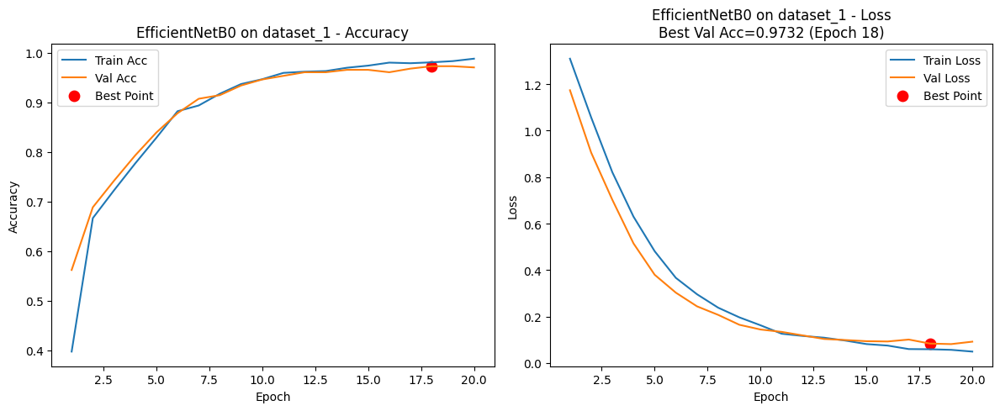

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth



Training MobileNetV2 on dataset_1


100%|██████████| 13.6M/13.6M [00:00<00:00, 151MB/s]
Valid E1/20: 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]


Epoch 1/20 | Train Loss 1.3401 Acc 0.3675 Val Loss 1.2254 Acc 0.5791
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 1.2254)


Valid E2/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 2/20 | Train Loss 1.1739 Acc 0.5996 Val Loss 1.0311 Acc 0.6667
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 1.0311)


Valid E3/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 3/20 | Train Loss 0.9765 Acc 0.6764 Val Loss 0.8328 Acc 0.7202
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.8328)


Valid E4/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 4/20 | Train Loss 0.7787 Acc 0.7252 Val Loss 0.6774 Acc 0.7640
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.6774)


Valid E5/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 5/20 | Train Loss 0.6039 Acc 0.7977 Val Loss 0.5101 Acc 0.8078
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.5101)


Valid E6/20: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


Epoch 6/20 | Train Loss 0.4823 Acc 0.8324 Val Loss 0.3897 Acc 0.8613
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.3897)


Valid E7/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 7/20 | Train Loss 0.3590 Acc 0.8787 Val Loss 0.3277 Acc 0.9002
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.3277)


Valid E8/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 8/20 | Train Loss 0.3040 Acc 0.9037 Val Loss 0.2933 Acc 0.9124
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.2933)


Valid E9/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 9/20 | Train Loss 0.2416 Acc 0.9226 Val Loss 0.2504 Acc 0.9124
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.2504)


Valid E10/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 10/20 | Train Loss 0.1969 Acc 0.9342 Val Loss 0.2168 Acc 0.9294
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.2168)


Valid E11/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 11/20 | Train Loss 0.1651 Acc 0.9519 Val Loss 0.1965 Acc 0.9440
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.1965)


Valid E12/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 12/20 | Train Loss 0.1543 Acc 0.9494 Val Loss 0.1844 Acc 0.9465
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.1844)


Valid E13/20: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


Epoch 13/20 | Train Loss 0.1405 Acc 0.9567 Val Loss 0.1735 Acc 0.9465
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.1735)


Valid E14/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 14/20 | Train Loss 0.1304 Acc 0.9604 Val Loss 0.1744 Acc 0.9513


Valid E15/20: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


Epoch 15/20 | Train Loss 0.1102 Acc 0.9640 Val Loss 0.1484 Acc 0.9489
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.1484)


Valid E16/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 16/20 | Train Loss 0.1021 Acc 0.9671 Val Loss 0.1373 Acc 0.9611
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.1373)


Valid E17/20: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


Epoch 17/20 | Train Loss 0.0961 Acc 0.9628 Val Loss 0.1429 Acc 0.9562


Valid E18/20: 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]


Epoch 18/20 | Train Loss 0.0855 Acc 0.9756 Val Loss 0.1383 Acc 0.9586


Valid E19/20: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


Epoch 19/20 | Train Loss 0.0759 Acc 0.9775 Val Loss 0.1141 Acc 0.9635
Saved BEST to /kaggle/working/MobileNetV2_dataset_1_best.pth (best val_loss: 0.1141)


Valid E20/20: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


Epoch 20/20 | Train Loss 0.0781 Acc 0.9775 Val Loss 0.1188 Acc 0.9635
Best val_loss: 0.1141


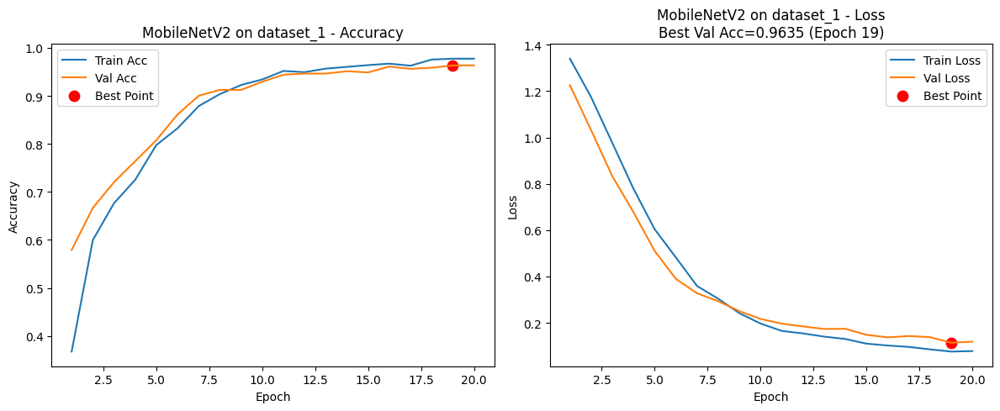


===== EVALUATING ON dataset_1+dataset_4 =====
Dataset sources: dataset_1+dataset_4
Split sizes: Train=2537, Val=635, Test=793

Training SimpleCNN on dataset_1+dataset_4


Valid E1/20: 100%|██████████| 5/5 [00:08<00:00,  1.60s/it]


Epoch 1/20 | Train Loss 1.3838 Acc 0.2613 Val Loss 1.3806 Acc 0.3165
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3806)


Valid E2/20: 100%|██████████| 5/5 [00:07<00:00,  1.45s/it]


Epoch 2/20 | Train Loss 1.3775 Acc 0.3224 Val Loss 1.3738 Acc 0.2945
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3738)


Valid E3/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 3/20 | Train Loss 1.3669 Acc 0.3433 Val Loss 1.3617 Acc 0.3465
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3617)


Valid E4/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 4/20 | Train Loss 1.3556 Acc 0.3429 Val Loss 1.3485 Acc 0.3260
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3485)


Valid E5/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 5/20 | Train Loss 1.3408 Acc 0.3587 Val Loss 1.3387 Acc 0.3528
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3387)


Valid E6/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 6/20 | Train Loss 1.3305 Acc 0.3563 Val Loss 1.3287 Acc 0.3150
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3287)


Valid E7/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 7/20 | Train Loss 1.3167 Acc 0.3749 Val Loss 1.3212 Acc 0.3701
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3212)


Valid E8/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 8/20 | Train Loss 1.3076 Acc 0.3855 Val Loss 1.2902 Acc 0.3858
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.2902)


Valid E9/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 9/20 | Train Loss 1.3018 Acc 0.3804 Val Loss 1.3000 Acc 0.3937


Valid E10/20: 100%|██████████| 5/5 [00:07<00:00,  1.51s/it]


Epoch 10/20 | Train Loss 1.2991 Acc 0.3835 Val Loss 1.2817 Acc 0.4031
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.2817)


Valid E11/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 11/20 | Train Loss 1.2953 Acc 0.3985 Val Loss 1.2751 Acc 0.4299
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.2751)


Valid E12/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 12/20 | Train Loss 1.2864 Acc 0.4068 Val Loss 1.2686 Acc 0.3638
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.2686)


Valid E13/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 13/20 | Train Loss 1.2678 Acc 0.4241 Val Loss 1.2490 Acc 0.4346
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.2490)


Valid E14/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 14/20 | Train Loss 1.2732 Acc 0.4095 Val Loss 1.2336 Acc 0.4126
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.2336)


Valid E15/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 15/20 | Train Loss 1.2596 Acc 0.4198 Val Loss 1.2382 Acc 0.4142


Valid E16/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 16/20 | Train Loss 1.2546 Acc 0.4344 Val Loss 1.2398 Acc 0.3984


Valid E17/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 17/20 | Train Loss 1.2593 Acc 0.4151 Val Loss 1.2019 Acc 0.4362
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.2019)


Valid E18/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 18/20 | Train Loss 1.2460 Acc 0.4356 Val Loss 1.1694 Acc 0.4898
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.1694)


Valid E19/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 19/20 | Train Loss 1.2359 Acc 0.4407 Val Loss 1.1950 Acc 0.4488


Valid E20/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 20/20 | Train Loss 1.2357 Acc 0.4470 Val Loss 1.1514 Acc 0.5181
Saved BEST to /kaggle/working/SimpleCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.1514)
Best val_loss: 1.1514


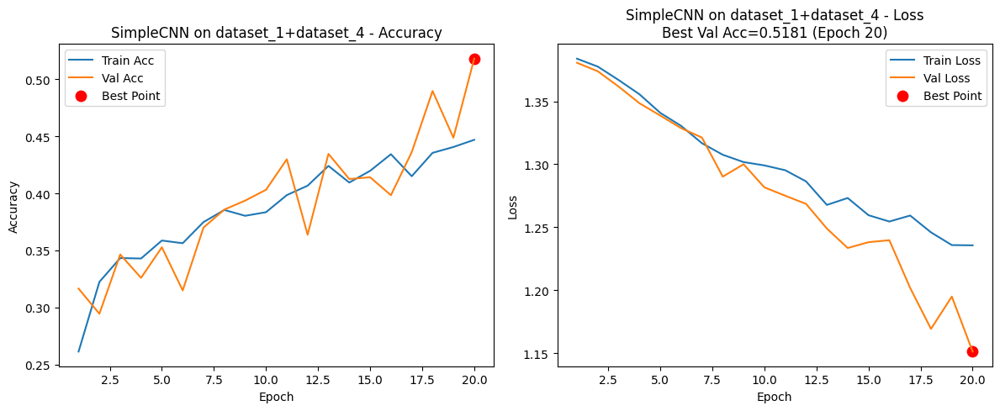


Training RiceLeafCNN on dataset_1+dataset_4


Valid E1/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 1/20 | Train Loss 1.3851 Acc 0.2838 Val Loss 1.3993 Acc 0.2520
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3993)


Valid E2/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 2/20 | Train Loss 1.3575 Acc 0.3279 Val Loss 1.3882 Acc 0.2520
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.3882)


Valid E3/20: 100%|██████████| 5/5 [00:07<00:00,  1.41s/it]


Epoch 3/20 | Train Loss 1.2743 Acc 0.4166 Val Loss 1.4474 Acc 0.2535


Valid E4/20: 100%|██████████| 5/5 [00:07<00:00,  1.45s/it]


Epoch 4/20 | Train Loss 1.2042 Acc 0.4517 Val Loss 1.1182 Acc 0.4913
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.1182)


Valid E5/20: 100%|██████████| 5/5 [00:07<00:00,  1.42s/it]


Epoch 5/20 | Train Loss 1.1631 Acc 0.4687 Val Loss 1.0235 Acc 0.5228
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 1.0235)


Valid E6/20: 100%|██████████| 5/5 [00:07<00:00,  1.41s/it]


Epoch 6/20 | Train Loss 1.1067 Acc 0.5140 Val Loss 1.0254 Acc 0.5118


Valid E7/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 7/20 | Train Loss 1.0667 Acc 0.5278 Val Loss 0.9605 Acc 0.6094
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 0.9605)


Valid E8/20: 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]


Epoch 8/20 | Train Loss 1.0533 Acc 0.5298 Val Loss 1.0271 Acc 0.5433


Valid E9/20: 100%|██████████| 5/5 [00:07<00:00,  1.44s/it]


Epoch 9/20 | Train Loss 1.0339 Acc 0.5392 Val Loss 0.9846 Acc 0.5638


Valid E10/20: 100%|██████████| 5/5 [00:07<00:00,  1.44s/it]


Epoch 10/20 | Train Loss 1.0119 Acc 0.5577 Val Loss 0.9222 Acc 0.6094
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 0.9222)


Valid E11/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 11/20 | Train Loss 0.9940 Acc 0.5664 Val Loss 0.9100 Acc 0.6189
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 0.9100)


Valid E12/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 12/20 | Train Loss 0.9708 Acc 0.5893 Val Loss 0.8632 Acc 0.6394
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 0.8632)


Valid E13/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 13/20 | Train Loss 0.9446 Acc 0.5940 Val Loss 0.8555 Acc 0.6709
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 0.8555)


Valid E14/20: 100%|██████████| 5/5 [00:07<00:00,  1.44s/it]


Epoch 14/20 | Train Loss 0.9241 Acc 0.6082 Val Loss 0.9033 Acc 0.6205


Valid E15/20: 100%|██████████| 5/5 [00:07<00:00,  1.44s/it]


Epoch 15/20 | Train Loss 0.8977 Acc 0.6259 Val Loss 0.8632 Acc 0.6236


Valid E16/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 16/20 | Train Loss 0.9127 Acc 0.6102 Val Loss 0.7606 Acc 0.6756
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 0.7606)


Valid E17/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 17/20 | Train Loss 0.8722 Acc 0.6409 Val Loss 1.1141 Acc 0.5969


Valid E18/20: 100%|██████████| 5/5 [00:07<00:00,  1.40s/it]


Epoch 18/20 | Train Loss 0.8837 Acc 0.6255 Val Loss 0.7981 Acc 0.6614


Valid E19/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 19/20 | Train Loss 0.8519 Acc 0.6441 Val Loss 0.7451 Acc 0.6898
Saved BEST to /kaggle/working/RiceLeafCNN_dataset_1+dataset_4_best.pth (best val_loss: 0.7451)


Valid E20/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 20/20 | Train Loss 0.8380 Acc 0.6488 Val Loss 0.7617 Acc 0.6551
Best val_loss: 0.7451


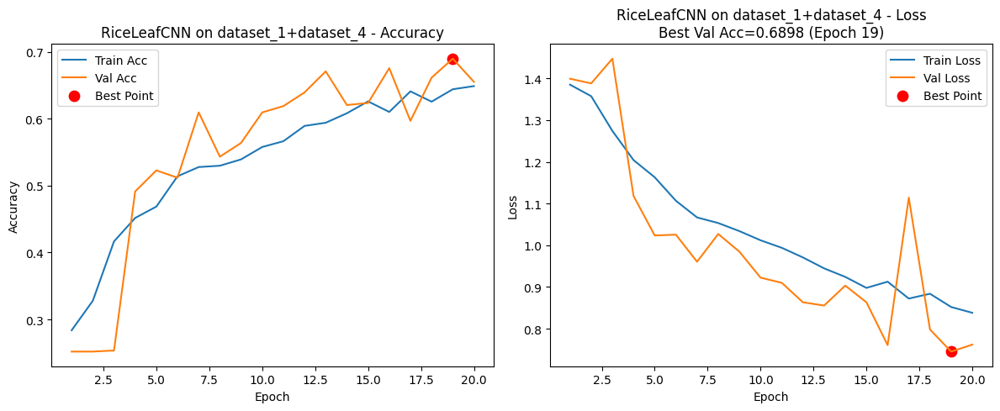


Training ResNet18 on dataset_1+dataset_4


Valid E1/20: 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]


Epoch 1/20 | Train Loss 0.9570 Acc 0.5920 Val Loss 0.5449 Acc 0.7890
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.5449)


Valid E2/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 2/20 | Train Loss 0.4953 Acc 0.8025 Val Loss 0.2821 Acc 0.8929
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.2821)


Valid E3/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 3/20 | Train Loss 0.3254 Acc 0.8758 Val Loss 0.2226 Acc 0.9087
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.2226)


Valid E4/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 4/20 | Train Loss 0.2472 Acc 0.9097 Val Loss 0.1612 Acc 0.9386
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.1612)


Valid E5/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 5/20 | Train Loss 0.2081 Acc 0.9231 Val Loss 0.1604 Acc 0.9354
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.1604)


Valid E6/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 6/20 | Train Loss 0.2034 Acc 0.9255 Val Loss 0.1245 Acc 0.9496
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.1245)


Valid E7/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 7/20 | Train Loss 0.1632 Acc 0.9405 Val Loss 0.0873 Acc 0.9717
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0873)


Valid E8/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 8/20 | Train Loss 0.1451 Acc 0.9452 Val Loss 0.0821 Acc 0.9717
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0821)


Valid E9/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 9/20 | Train Loss 0.1234 Acc 0.9555 Val Loss 0.0734 Acc 0.9780
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0734)


Valid E10/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 10/20 | Train Loss 0.1186 Acc 0.9555 Val Loss 0.0698 Acc 0.9764
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0698)


Valid E11/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 11/20 | Train Loss 0.1082 Acc 0.9594 Val Loss 0.0786 Acc 0.9732


Valid E12/20: 100%|██████████| 5/5 [00:07<00:00,  1.42s/it]


Epoch 12/20 | Train Loss 0.0860 Acc 0.9689 Val Loss 0.0663 Acc 0.9780
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0663)


Valid E13/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 13/20 | Train Loss 0.0841 Acc 0.9712 Val Loss 0.0591 Acc 0.9748
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0591)


Valid E14/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 14/20 | Train Loss 0.0781 Acc 0.9732 Val Loss 0.0741 Acc 0.9732


Valid E15/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 15/20 | Train Loss 0.0782 Acc 0.9708 Val Loss 0.1132 Acc 0.9591


Valid E16/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 16/20 | Train Loss 0.0853 Acc 0.9677 Val Loss 0.0656 Acc 0.9843


Valid E17/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 17/20 | Train Loss 0.0650 Acc 0.9795 Val Loss 0.0637 Acc 0.9748


Valid E18/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 18/20 | Train Loss 0.0627 Acc 0.9803 Val Loss 0.0553 Acc 0.9795
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0553)


Valid E19/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 19/20 | Train Loss 0.0478 Acc 0.9831 Val Loss 0.0510 Acc 0.9811
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0510)


Valid E20/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 20/20 | Train Loss 0.0495 Acc 0.9834 Val Loss 0.0385 Acc 0.9874
Saved BEST to /kaggle/working/ResNet18_dataset_1+dataset_4_best.pth (best val_loss: 0.0385)
Best val_loss: 0.0385


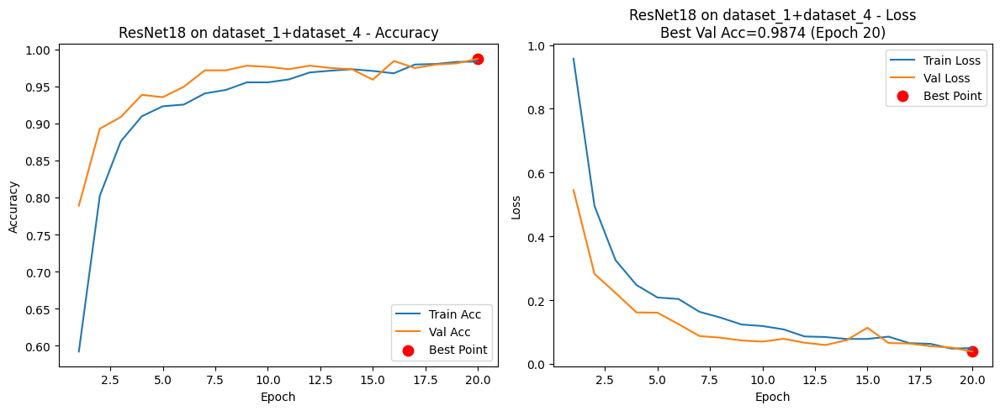


Training ResNet50 on dataset_1+dataset_4


Valid E1/20: 100%|██████████| 5/5 [00:08<00:00,  1.74s/it]


Epoch 1/20 | Train Loss 1.2092 Acc 0.5585 Val Loss 0.8472 Acc 0.7449
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.8472)


Valid E2/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 2/20 | Train Loss 0.6408 Acc 0.7935 Val Loss 0.3581 Acc 0.8614
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.3581)


Valid E3/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 3/20 | Train Loss 0.2851 Acc 0.9066 Val Loss 0.1836 Acc 0.9260
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.1836)


Valid E4/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 4/20 | Train Loss 0.1937 Acc 0.9283 Val Loss 0.1235 Acc 0.9575
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.1235)


Valid E5/20: 100%|██████████| 5/5 [00:07<00:00,  1.54s/it]


Epoch 5/20 | Train Loss 0.1393 Acc 0.9515 Val Loss 0.0881 Acc 0.9669
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0881)


Valid E6/20: 100%|██████████| 5/5 [00:07<00:00,  1.51s/it]


Epoch 6/20 | Train Loss 0.1049 Acc 0.9657 Val Loss 0.0801 Acc 0.9748
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0801)


Valid E7/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 7/20 | Train Loss 0.1002 Acc 0.9629 Val Loss 0.0585 Acc 0.9748
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0585)


Valid E8/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 8/20 | Train Loss 0.0764 Acc 0.9732 Val Loss 0.0465 Acc 0.9858
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0465)


Valid E9/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 9/20 | Train Loss 0.0694 Acc 0.9764 Val Loss 0.0643 Acc 0.9701


Valid E10/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 10/20 | Train Loss 0.0648 Acc 0.9775 Val Loss 0.0595 Acc 0.9764


Valid E11/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 11/20 | Train Loss 0.0696 Acc 0.9767 Val Loss 0.0630 Acc 0.9795


Valid E12/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 12/20 | Train Loss 0.0488 Acc 0.9862 Val Loss 0.0490 Acc 0.9795


Valid E13/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 13/20 | Train Loss 0.0411 Acc 0.9858 Val Loss 0.0416 Acc 0.9858
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0416)


Valid E14/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 14/20 | Train Loss 0.0346 Acc 0.9890 Val Loss 0.0396 Acc 0.9858
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0396)


Valid E15/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 15/20 | Train Loss 0.0334 Acc 0.9890 Val Loss 0.0439 Acc 0.9874


Valid E16/20: 100%|██████████| 5/5 [00:07<00:00,  1.45s/it]


Epoch 16/20 | Train Loss 0.0340 Acc 0.9886 Val Loss 0.0456 Acc 0.9874


Valid E17/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 17/20 | Train Loss 0.0235 Acc 0.9925 Val Loss 0.0388 Acc 0.9906
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0388)


Valid E18/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 18/20 | Train Loss 0.0299 Acc 0.9886 Val Loss 0.0437 Acc 0.9874


Valid E19/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 19/20 | Train Loss 0.0251 Acc 0.9913 Val Loss 0.0378 Acc 0.9874
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0378)


Valid E20/20: 100%|██████████| 5/5 [00:07<00:00,  1.51s/it]


Epoch 20/20 | Train Loss 0.0339 Acc 0.9870 Val Loss 0.0352 Acc 0.9890
Saved BEST to /kaggle/working/ResNet50_dataset_1+dataset_4_best.pth (best val_loss: 0.0352)
Best val_loss: 0.0352


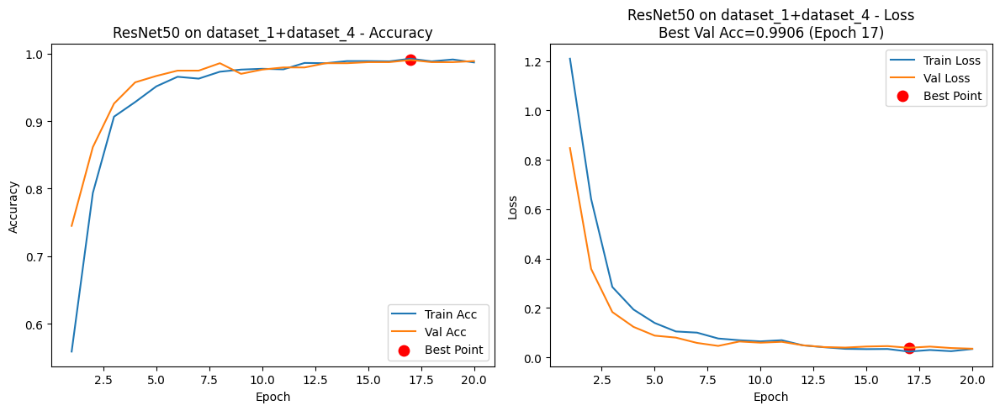


Training EfficientNetB0 on dataset_1+dataset_4


Valid E1/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 1/20 | Train Loss 1.3016 Acc 0.4024 Val Loss 1.1235 Acc 0.6362
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 1.1235)


Valid E2/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 2/20 | Train Loss 1.0040 Acc 0.6468 Val Loss 0.8175 Acc 0.7276
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.8175)


Valid E3/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 3/20 | Train Loss 0.7443 Acc 0.7477 Val Loss 0.5491 Acc 0.8047
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.5491)


Valid E4/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 4/20 | Train Loss 0.5271 Acc 0.8159 Val Loss 0.3517 Acc 0.8724
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.3517)


Valid E5/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 5/20 | Train Loss 0.3841 Acc 0.8719 Val Loss 0.2546 Acc 0.9071
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.2546)


Valid E6/20: 100%|██████████| 5/5 [00:07<00:00,  1.51s/it]


Epoch 6/20 | Train Loss 0.3053 Acc 0.8952 Val Loss 0.2110 Acc 0.9402
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.2110)


Valid E7/20: 100%|██████████| 5/5 [00:08<00:00,  1.62s/it]


Epoch 7/20 | Train Loss 0.2379 Acc 0.9227 Val Loss 0.1694 Acc 0.9465
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.1694)


Valid E8/20: 100%|██████████| 5/5 [00:08<00:00,  1.66s/it]


Epoch 8/20 | Train Loss 0.1996 Acc 0.9302 Val Loss 0.1451 Acc 0.9496
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.1451)


Valid E9/20: 100%|██████████| 5/5 [00:07<00:00,  1.44s/it]


Epoch 9/20 | Train Loss 0.1774 Acc 0.9346 Val Loss 0.1153 Acc 0.9669
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.1153)


Valid E10/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 10/20 | Train Loss 0.1480 Acc 0.9484 Val Loss 0.1168 Acc 0.9622


Valid E11/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 11/20 | Train Loss 0.1287 Acc 0.9535 Val Loss 0.0974 Acc 0.9685
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0974)


Valid E12/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 12/20 | Train Loss 0.1127 Acc 0.9633 Val Loss 0.0883 Acc 0.9685
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0883)


Valid E13/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 13/20 | Train Loss 0.1142 Acc 0.9590 Val Loss 0.0890 Acc 0.9669


Valid E14/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 14/20 | Train Loss 0.0980 Acc 0.9661 Val Loss 0.0842 Acc 0.9732
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0842)


Valid E15/20: 100%|██████████| 5/5 [00:07<00:00,  1.53s/it]


Epoch 15/20 | Train Loss 0.1094 Acc 0.9614 Val Loss 0.0833 Acc 0.9669
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0833)


Valid E16/20: 100%|██████████| 5/5 [00:07<00:00,  1.51s/it]


Epoch 16/20 | Train Loss 0.0934 Acc 0.9649 Val Loss 0.0738 Acc 0.9748
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0738)


Valid E17/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 17/20 | Train Loss 0.0770 Acc 0.9756 Val Loss 0.0755 Acc 0.9732


Valid E18/20: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


Epoch 18/20 | Train Loss 0.0759 Acc 0.9736 Val Loss 0.0694 Acc 0.9795
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0694)


Valid E19/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 19/20 | Train Loss 0.0747 Acc 0.9760 Val Loss 0.0686 Acc 0.9811
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0686)


Valid E20/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 20/20 | Train Loss 0.0648 Acc 0.9799 Val Loss 0.0625 Acc 0.9795
Saved BEST to /kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth (best val_loss: 0.0625)
Best val_loss: 0.0625


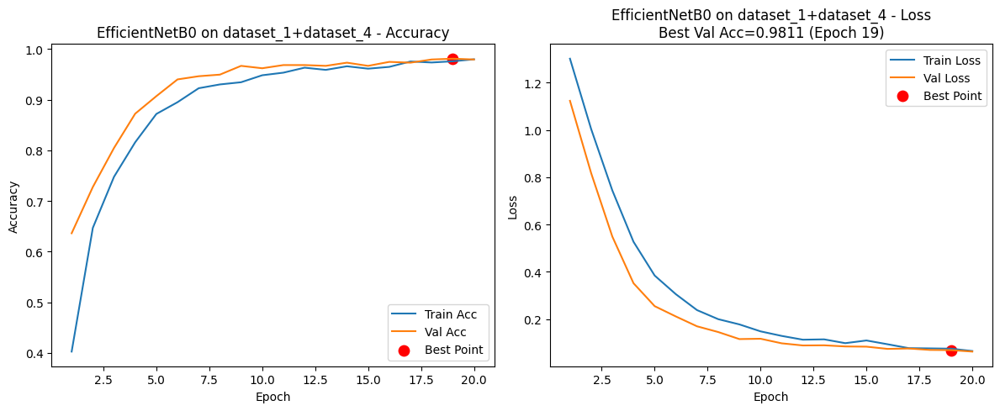


Training MobileNetV2 on dataset_1+dataset_4


Valid E1/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 1/20 | Train Loss 1.3333 Acc 0.3689 Val Loss 1.2123 Acc 0.5591
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 1.2123)


Valid E2/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 2/20 | Train Loss 1.1211 Acc 0.6019 Val Loss 0.9846 Acc 0.6661
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.9846)


Valid E3/20: 100%|██████████| 5/5 [00:07<00:00,  1.44s/it]


Epoch 3/20 | Train Loss 0.8916 Acc 0.6894 Val Loss 0.7249 Acc 0.7559
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.7249)


Valid E4/20: 100%|██████████| 5/5 [00:07<00:00,  1.42s/it]


Epoch 4/20 | Train Loss 0.6683 Acc 0.7556 Val Loss 0.5141 Acc 0.8236
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.5141)


Valid E5/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 5/20 | Train Loss 0.5022 Acc 0.8266 Val Loss 0.3713 Acc 0.8551
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.3713)


Valid E6/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 6/20 | Train Loss 0.3840 Acc 0.8632 Val Loss 0.2941 Acc 0.8992
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.2941)


Valid E7/20: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]


Epoch 7/20 | Train Loss 0.3139 Acc 0.8888 Val Loss 0.2327 Acc 0.9228
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.2327)


Valid E8/20: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]


Epoch 8/20 | Train Loss 0.2592 Acc 0.9137 Val Loss 0.2014 Acc 0.9244
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.2014)


Valid E9/20: 100%|██████████| 5/5 [00:07<00:00,  1.45s/it]


Epoch 9/20 | Train Loss 0.2081 Acc 0.9294 Val Loss 0.1728 Acc 0.9433
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.1728)


Valid E10/20: 100%|██████████| 5/5 [00:07<00:00,  1.44s/it]


Epoch 10/20 | Train Loss 0.2026 Acc 0.9306 Val Loss 0.1522 Acc 0.9465
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.1522)


Valid E11/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 11/20 | Train Loss 0.1686 Acc 0.9401 Val Loss 0.1385 Acc 0.9606
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.1385)


Valid E12/20: 100%|██████████| 5/5 [00:07<00:00,  1.54s/it]


Epoch 12/20 | Train Loss 0.1544 Acc 0.9464 Val Loss 0.1187 Acc 0.9606
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.1187)


Valid E13/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 13/20 | Train Loss 0.1405 Acc 0.9559 Val Loss 0.1144 Acc 0.9685
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.1144)


Valid E14/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 14/20 | Train Loss 0.1222 Acc 0.9574 Val Loss 0.1041 Acc 0.9622
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.1041)


Valid E15/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 15/20 | Train Loss 0.1138 Acc 0.9586 Val Loss 0.1009 Acc 0.9669
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.1009)


Valid E16/20: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


Epoch 16/20 | Train Loss 0.1084 Acc 0.9614 Val Loss 0.0903 Acc 0.9717
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.0903)


Valid E17/20: 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


Epoch 17/20 | Train Loss 0.0978 Acc 0.9657 Val Loss 0.0787 Acc 0.9764
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.0787)


Valid E18/20: 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]


Epoch 18/20 | Train Loss 0.0793 Acc 0.9756 Val Loss 0.0862 Acc 0.9701


Valid E19/20: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]


Epoch 19/20 | Train Loss 0.0814 Acc 0.9744 Val Loss 0.0732 Acc 0.9764
Saved BEST to /kaggle/working/MobileNetV2_dataset_1+dataset_4_best.pth (best val_loss: 0.0732)


Valid E20/20: 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]


Epoch 20/20 | Train Loss 0.0753 Acc 0.9740 Val Loss 0.0991 Acc 0.9717
Best val_loss: 0.0732


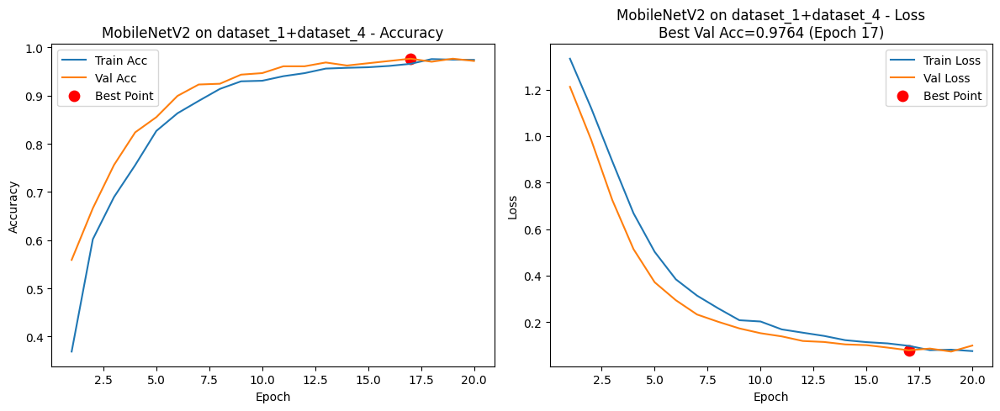


===== EVALUATING ON all_sources =====
Dataset sources: all_sources
Split sizes: Train=7180, Val=1795, Test=2244

Training SimpleCNN on all_sources


Valid E1/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 1/20 | Train Loss 1.3292 Acc 0.3961 Val Loss 1.2676 Acc 0.4267
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.2676)


Valid E2/20: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


Epoch 2/20 | Train Loss 1.2525 Acc 0.4329 Val Loss 1.2133 Acc 0.4507
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.2133)


Valid E3/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 3/20 | Train Loss 1.2163 Acc 0.4696 Val Loss 1.1571 Acc 0.4908
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.1571)


Valid E4/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 4/20 | Train Loss 1.1875 Acc 0.4805 Val Loss 1.1367 Acc 0.4791
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.1367)


Valid E5/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 5/20 | Train Loss 1.1632 Acc 0.5026 Val Loss 1.1311 Acc 0.4841
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.1311)


Valid E6/20: 100%|██████████| 15/15 [00:17<00:00,  1.13s/it]


Epoch 6/20 | Train Loss 1.1550 Acc 0.4992 Val Loss 1.1079 Acc 0.5097
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.1079)


Valid E7/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 7/20 | Train Loss 1.1398 Acc 0.5117 Val Loss 1.0961 Acc 0.5220
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.0961)


Valid E8/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 8/20 | Train Loss 1.1238 Acc 0.5189 Val Loss 1.0730 Acc 0.5287
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.0730)


Valid E9/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 9/20 | Train Loss 1.1154 Acc 0.5279 Val Loss 1.0465 Acc 0.5532
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.0465)


Valid E10/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 10/20 | Train Loss 1.1116 Acc 0.5330 Val Loss 1.0609 Acc 0.5443


Valid E11/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 11/20 | Train Loss 1.1039 Acc 0.5343 Val Loss 1.0488 Acc 0.5426


Valid E12/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 12/20 | Train Loss 1.0918 Acc 0.5394 Val Loss 1.0156 Acc 0.5727
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.0156)


Valid E13/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 13/20 | Train Loss 1.0806 Acc 0.5483 Val Loss 1.0138 Acc 0.5749
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.0138)


Valid E14/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 14/20 | Train Loss 1.0758 Acc 0.5514 Val Loss 1.0506 Acc 0.5538


Valid E15/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 15/20 | Train Loss 1.0708 Acc 0.5483 Val Loss 1.0119 Acc 0.5632
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 1.0119)


Valid E16/20: 100%|██████████| 15/15 [00:17<00:00,  1.13s/it]


Epoch 16/20 | Train Loss 1.0665 Acc 0.5632 Val Loss 1.0221 Acc 0.5643


Valid E17/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 17/20 | Train Loss 1.0640 Acc 0.5592 Val Loss 0.9838 Acc 0.5844
Saved BEST to /kaggle/working/SimpleCNN_all_sources_best.pth (best val_loss: 0.9838)


Valid E18/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 18/20 | Train Loss 1.0562 Acc 0.5643 Val Loss 1.0002 Acc 0.5699


Valid E19/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 19/20 | Train Loss 1.0434 Acc 0.5740 Val Loss 1.0018 Acc 0.5760


Valid E20/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 20/20 | Train Loss 1.0406 Acc 0.5673 Val Loss 0.9874 Acc 0.5783
Best val_loss: 0.9838


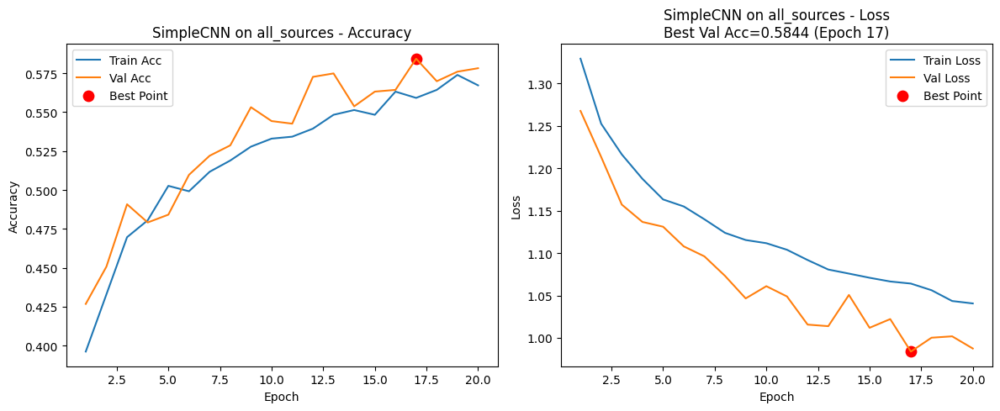


Training RiceLeafCNN on all_sources


Valid E1/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 1/20 | Train Loss 1.2161 Acc 0.4543 Val Loss 1.4122 Acc 0.3220
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 1.4122)


Valid E2/20: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it]


Epoch 2/20 | Train Loss 1.0234 Acc 0.5656 Val Loss 0.9065 Acc 0.6150
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.9065)


Valid E3/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 3/20 | Train Loss 0.9536 Acc 0.5955 Val Loss 0.8775 Acc 0.6357
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.8775)


Valid E4/20: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it]


Epoch 4/20 | Train Loss 0.9166 Acc 0.6014 Val Loss 0.8339 Acc 0.6384
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.8339)


Valid E5/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 5/20 | Train Loss 0.8881 Acc 0.6178 Val Loss 0.7748 Acc 0.6574
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.7748)


Valid E6/20: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Epoch 6/20 | Train Loss 0.8669 Acc 0.6272 Val Loss 0.7910 Acc 0.6897


Valid E7/20: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


Epoch 7/20 | Train Loss 0.8602 Acc 0.6277 Val Loss 0.7570 Acc 0.6713
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.7570)


Valid E8/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 8/20 | Train Loss 0.8375 Acc 0.6379 Val Loss 0.7448 Acc 0.6724
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.7448)


Valid E9/20: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it]


Epoch 9/20 | Train Loss 0.8331 Acc 0.6415 Val Loss 0.7015 Acc 0.7003
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.7015)


Valid E10/20: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it]


Epoch 10/20 | Train Loss 0.8117 Acc 0.6444 Val Loss 0.7075 Acc 0.6903


Valid E11/20: 100%|██████████| 15/15 [00:18<00:00,  1.23s/it]


Epoch 11/20 | Train Loss 0.8030 Acc 0.6539 Val Loss 0.6914 Acc 0.7148
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.6914)


Valid E12/20: 100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


Epoch 12/20 | Train Loss 0.7921 Acc 0.6586 Val Loss 0.6928 Acc 0.7081


Valid E13/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 13/20 | Train Loss 0.7853 Acc 0.6641 Val Loss 0.6575 Acc 0.7270
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.6575)


Valid E14/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 14/20 | Train Loss 0.7626 Acc 0.6730 Val Loss 0.6470 Acc 0.7415
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.6470)


Valid E15/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 15/20 | Train Loss 0.7612 Acc 0.6760 Val Loss 0.7384 Acc 0.6875


Valid E16/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 16/20 | Train Loss 0.7641 Acc 0.6730 Val Loss 0.6667 Acc 0.7281


Valid E17/20: 100%|██████████| 15/15 [00:17<00:00,  1.13s/it]


Epoch 17/20 | Train Loss 0.7453 Acc 0.6841 Val Loss 0.6453 Acc 0.7331
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.6453)


Valid E18/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 18/20 | Train Loss 0.7369 Acc 0.6876 Val Loss 0.6638 Acc 0.7253


Valid E19/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 19/20 | Train Loss 0.7308 Acc 0.6855 Val Loss 0.6477 Acc 0.7348


Valid E20/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 20/20 | Train Loss 0.7237 Acc 0.6968 Val Loss 0.6296 Acc 0.7437
Saved BEST to /kaggle/working/RiceLeafCNN_all_sources_best.pth (best val_loss: 0.6296)
Best val_loss: 0.6296


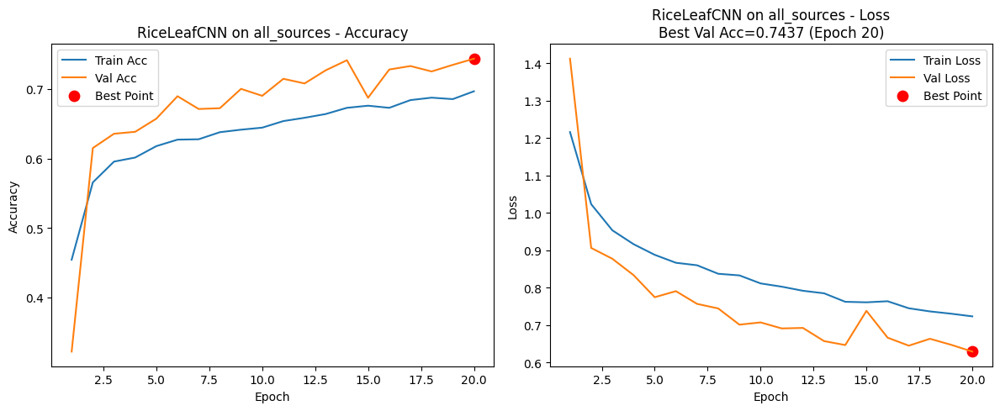


Training ResNet18 on all_sources


Valid E1/20: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Epoch 1/20 | Train Loss 0.6712 Acc 0.7169 Val Loss 0.3737 Acc 0.8557
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.3737)


Valid E2/20: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


Epoch 2/20 | Train Loss 0.3682 Acc 0.8604 Val Loss 0.2995 Acc 0.8875
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.2995)


Valid E3/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 3/20 | Train Loss 0.3012 Acc 0.8882 Val Loss 0.2547 Acc 0.8969
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.2547)


Valid E4/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 4/20 | Train Loss 0.2772 Acc 0.8976 Val Loss 0.2101 Acc 0.9287
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.2101)


Valid E5/20: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Epoch 5/20 | Train Loss 0.2504 Acc 0.9082 Val Loss 0.2503 Acc 0.9136


Valid E6/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 6/20 | Train Loss 0.2381 Acc 0.9143 Val Loss 0.2145 Acc 0.9259


Valid E7/20: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


Epoch 7/20 | Train Loss 0.2264 Acc 0.9189 Val Loss 0.2056 Acc 0.9242
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.2056)


Valid E8/20: 100%|██████████| 15/15 [00:16<00:00,  1.07s/it]


Epoch 8/20 | Train Loss 0.2126 Acc 0.9252 Val Loss 0.1847 Acc 0.9281
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.1847)


Valid E9/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 9/20 | Train Loss 0.2075 Acc 0.9249 Val Loss 0.1940 Acc 0.9265


Valid E10/20: 100%|██████████| 15/15 [00:17<00:00,  1.13s/it]


Epoch 10/20 | Train Loss 0.1895 Acc 0.9312 Val Loss 0.1643 Acc 0.9409
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.1643)


Valid E11/20: 100%|██████████| 15/15 [00:17<00:00,  1.13s/it]


Epoch 11/20 | Train Loss 0.1799 Acc 0.9365 Val Loss 0.1679 Acc 0.9404


Valid E12/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 12/20 | Train Loss 0.1698 Acc 0.9394 Val Loss 0.1561 Acc 0.9437
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.1561)


Valid E13/20: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Epoch 13/20 | Train Loss 0.1878 Acc 0.9325 Val Loss 0.1935 Acc 0.9248


Valid E14/20: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Epoch 14/20 | Train Loss 0.1754 Acc 0.9372 Val Loss 0.1604 Acc 0.9460


Valid E15/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 15/20 | Train Loss 0.1612 Acc 0.9453 Val Loss 0.1878 Acc 0.9309


Valid E16/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 16/20 | Train Loss 0.1658 Acc 0.9425 Val Loss 0.1438 Acc 0.9471
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.1438)


Valid E17/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 17/20 | Train Loss 0.1439 Acc 0.9517 Val Loss 0.1374 Acc 0.9504
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.1374)


Valid E18/20: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


Epoch 18/20 | Train Loss 0.1378 Acc 0.9522 Val Loss 0.1295 Acc 0.9554
Saved BEST to /kaggle/working/ResNet18_all_sources_best.pth (best val_loss: 0.1295)


Valid E19/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 19/20 | Train Loss 0.1409 Acc 0.9492 Val Loss 0.1375 Acc 0.9476


Valid E20/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 20/20 | Train Loss 0.1266 Acc 0.9553 Val Loss 0.1398 Acc 0.9510
Best val_loss: 0.1295


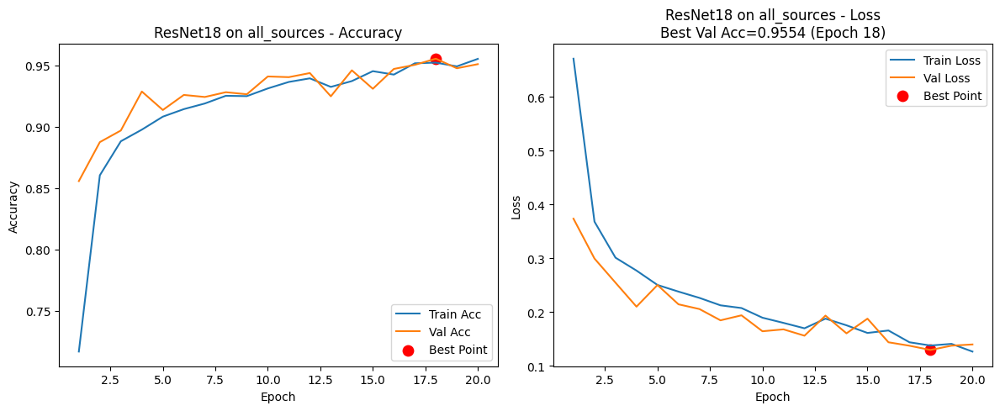


Training ResNet50 on all_sources


Valid E1/20: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


Epoch 1/20 | Train Loss 0.8317 Acc 0.6728 Val Loss 0.3695 Acc 0.8691
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.3695)


Valid E2/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 2/20 | Train Loss 0.3176 Acc 0.8836 Val Loss 0.2309 Acc 0.9181
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.2309)


Valid E3/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 3/20 | Train Loss 0.2338 Acc 0.9163 Val Loss 0.1914 Acc 0.9326
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1914)


Valid E4/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 4/20 | Train Loss 0.2006 Acc 0.9302 Val Loss 0.1831 Acc 0.9370
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1831)


Valid E5/20: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


Epoch 5/20 | Train Loss 0.1885 Acc 0.9350 Val Loss 0.1781 Acc 0.9409
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1781)


Valid E6/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 6/20 | Train Loss 0.1657 Acc 0.9416 Val Loss 0.1582 Acc 0.9454
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1582)


Valid E7/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 7/20 | Train Loss 0.1535 Acc 0.9468 Val Loss 0.1708 Acc 0.9404


Valid E8/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 8/20 | Train Loss 0.1534 Acc 0.9465 Val Loss 0.1514 Acc 0.9510
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1514)


Valid E9/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 9/20 | Train Loss 0.1545 Acc 0.9465 Val Loss 0.1533 Acc 0.9493


Valid E10/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 10/20 | Train Loss 0.1290 Acc 0.9561 Val Loss 0.1230 Acc 0.9593
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1230)


Valid E11/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 11/20 | Train Loss 0.1229 Acc 0.9575 Val Loss 0.1428 Acc 0.9526


Valid E12/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 12/20 | Train Loss 0.1290 Acc 0.9533 Val Loss 0.1358 Acc 0.9549


Valid E13/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 13/20 | Train Loss 0.1277 Acc 0.9553 Val Loss 0.1291 Acc 0.9565


Valid E14/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 14/20 | Train Loss 0.1139 Acc 0.9607 Val Loss 0.1216 Acc 0.9565
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1216)


Valid E15/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 15/20 | Train Loss 0.0973 Acc 0.9666 Val Loss 0.1130 Acc 0.9632
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1130)


Valid E16/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 16/20 | Train Loss 0.0870 Acc 0.9687 Val Loss 0.1107 Acc 0.9643
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1107)


Valid E17/20: 100%|██████████| 15/15 [00:17<00:00,  1.17s/it]


Epoch 17/20 | Train Loss 0.0906 Acc 0.9682 Val Loss 0.1168 Acc 0.9638


Valid E18/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 18/20 | Train Loss 0.0843 Acc 0.9684 Val Loss 0.1185 Acc 0.9616


Valid E19/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 19/20 | Train Loss 0.0946 Acc 0.9669 Val Loss 0.1172 Acc 0.9638


Valid E20/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 20/20 | Train Loss 0.0802 Acc 0.9745 Val Loss 0.1098 Acc 0.9671
Saved BEST to /kaggle/working/ResNet50_all_sources_best.pth (best val_loss: 0.1098)
Best val_loss: 0.1098


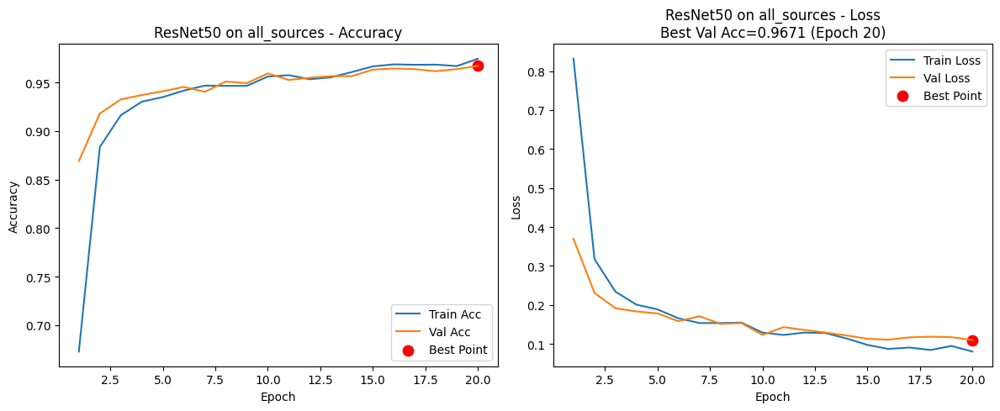


Training EfficientNetB0 on all_sources


Valid E1/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 1/20 | Train Loss 0.9957 Acc 0.5908 Val Loss 0.6317 Acc 0.7666
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.6317)


Valid E2/20: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


Epoch 2/20 | Train Loss 0.5435 Acc 0.7983 Val Loss 0.3604 Acc 0.8646
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.3604)


Valid E3/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 3/20 | Train Loss 0.3691 Acc 0.8684 Val Loss 0.2752 Acc 0.8992
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.2752)


Valid E4/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 4/20 | Train Loss 0.3035 Acc 0.8896 Val Loss 0.2499 Acc 0.9114
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.2499)


Valid E5/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 5/20 | Train Loss 0.2714 Acc 0.9035 Val Loss 0.2213 Acc 0.9248
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.2213)


Valid E6/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 6/20 | Train Loss 0.2432 Acc 0.9109 Val Loss 0.1986 Acc 0.9326
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1986)


Valid E7/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 7/20 | Train Loss 0.2221 Acc 0.9209 Val Loss 0.1978 Acc 0.9320
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1978)


Valid E8/20: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


Epoch 8/20 | Train Loss 0.2055 Acc 0.9265 Val Loss 0.1944 Acc 0.9326
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1944)


Valid E9/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 9/20 | Train Loss 0.2051 Acc 0.9272 Val Loss 0.1811 Acc 0.9393
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1811)


Valid E10/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 10/20 | Train Loss 0.1926 Acc 0.9325 Val Loss 0.1742 Acc 0.9393
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1742)


Valid E11/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 11/20 | Train Loss 0.1934 Acc 0.9318 Val Loss 0.1695 Acc 0.9415
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1695)


Valid E12/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 12/20 | Train Loss 0.1746 Acc 0.9362 Val Loss 0.1597 Acc 0.9448
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1597)


Valid E13/20: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


Epoch 13/20 | Train Loss 0.1736 Acc 0.9358 Val Loss 0.1531 Acc 0.9476
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1531)


Valid E14/20: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


Epoch 14/20 | Train Loss 0.1671 Acc 0.9384 Val Loss 0.1461 Acc 0.9493
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1461)


Valid E15/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 15/20 | Train Loss 0.1625 Acc 0.9430 Val Loss 0.1446 Acc 0.9538
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1446)


Valid E16/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 16/20 | Train Loss 0.1614 Acc 0.9416 Val Loss 0.1390 Acc 0.9487
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1390)


Valid E17/20: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


Epoch 17/20 | Train Loss 0.1546 Acc 0.9444 Val Loss 0.1263 Acc 0.9538
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1263)


Valid E18/20: 100%|██████████| 15/15 [00:17<00:00,  1.17s/it]


Epoch 18/20 | Train Loss 0.1529 Acc 0.9468 Val Loss 0.1388 Acc 0.9515


Valid E19/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 19/20 | Train Loss 0.1444 Acc 0.9485 Val Loss 0.1222 Acc 0.9560
Saved BEST to /kaggle/working/EfficientNetB0_all_sources_best.pth (best val_loss: 0.1222)


Valid E20/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 20/20 | Train Loss 0.1374 Acc 0.9489 Val Loss 0.1234 Acc 0.9549
Best val_loss: 0.1222


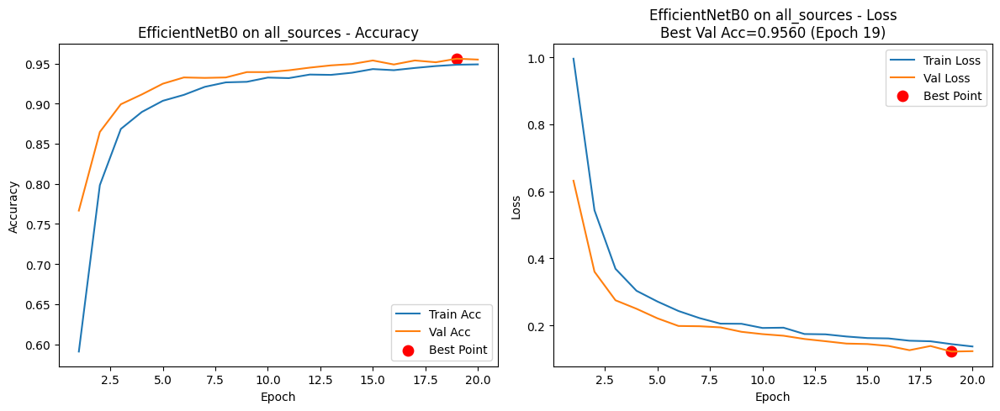


Training MobileNetV2 on all_sources


Valid E1/20: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


Epoch 1/20 | Train Loss 1.0491 Acc 0.5632 Val Loss 0.7169 Acc 0.7398
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.7169)


Valid E2/20: 100%|██████████| 15/15 [00:17<00:00,  1.16s/it]


Epoch 2/20 | Train Loss 0.5946 Acc 0.7776 Val Loss 0.4413 Acc 0.8390
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.4413)


Valid E3/20: 100%|██████████| 15/15 [00:21<00:00,  1.46s/it]


Epoch 3/20 | Train Loss 0.4112 Acc 0.8494 Val Loss 0.3371 Acc 0.8730
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.3371)


Valid E4/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 4/20 | Train Loss 0.3264 Acc 0.8818 Val Loss 0.2709 Acc 0.8975
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.2709)


Valid E5/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 5/20 | Train Loss 0.2947 Acc 0.8928 Val Loss 0.2523 Acc 0.9047
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.2523)


Valid E6/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 6/20 | Train Loss 0.2709 Acc 0.9025 Val Loss 0.2370 Acc 0.9103
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.2370)


Valid E7/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 7/20 | Train Loss 0.2368 Acc 0.9141 Val Loss 0.2409 Acc 0.9209


Valid E8/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 8/20 | Train Loss 0.2282 Acc 0.9114 Val Loss 0.2029 Acc 0.9253
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.2029)


Valid E9/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 9/20 | Train Loss 0.2161 Acc 0.9230 Val Loss 0.1905 Acc 0.9348
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1905)


Valid E10/20: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Epoch 10/20 | Train Loss 0.1980 Acc 0.9308 Val Loss 0.1898 Acc 0.9337
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1898)


Valid E11/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 11/20 | Train Loss 0.2047 Acc 0.9249 Val Loss 0.1968 Acc 0.9265


Valid E12/20: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Epoch 12/20 | Train Loss 0.1822 Acc 0.9358 Val Loss 0.1742 Acc 0.9354
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1742)


Valid E13/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 13/20 | Train Loss 0.1779 Acc 0.9389 Val Loss 0.1696 Acc 0.9415
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1696)


Valid E14/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 14/20 | Train Loss 0.1805 Acc 0.9344 Val Loss 0.1576 Acc 0.9471
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1576)


Valid E15/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 15/20 | Train Loss 0.1706 Acc 0.9383 Val Loss 0.1544 Acc 0.9465
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1544)


Valid E16/20: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]


Epoch 16/20 | Train Loss 0.1672 Acc 0.9412 Val Loss 0.1508 Acc 0.9499
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1508)


Valid E17/20: 100%|██████████| 15/15 [00:16<00:00,  1.07s/it]


Epoch 17/20 | Train Loss 0.1543 Acc 0.9440 Val Loss 0.1621 Acc 0.9432


Valid E18/20: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it]


Epoch 18/20 | Train Loss 0.1576 Acc 0.9409 Val Loss 0.1453 Acc 0.9465
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1453)


Valid E19/20: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]


Epoch 19/20 | Train Loss 0.1659 Acc 0.9407 Val Loss 0.1615 Acc 0.9443


Valid E20/20: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]


Epoch 20/20 | Train Loss 0.1499 Acc 0.9472 Val Loss 0.1436 Acc 0.9499
Saved BEST to /kaggle/working/MobileNetV2_all_sources_best.pth (best val_loss: 0.1436)
Best val_loss: 0.1436


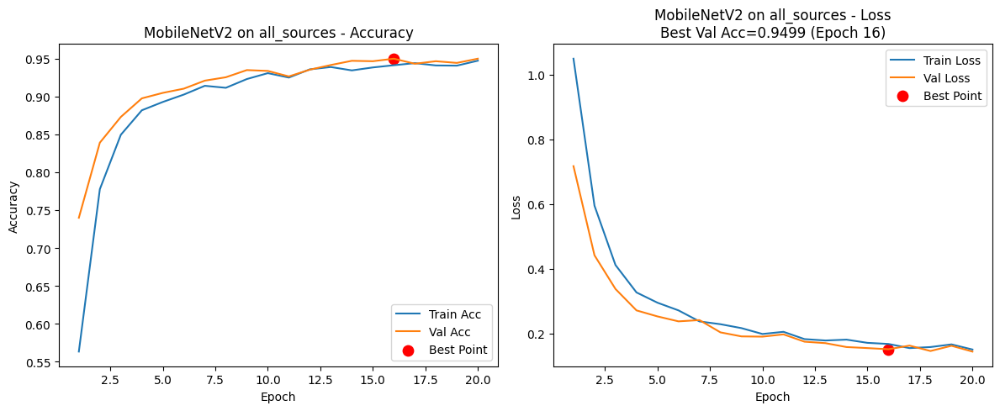


COMPREHENSIVE RESULTS
         Model             Dataset  Test Acc  Precision   Recall       F1  Params (M)  Latency (ms)         FPS                                                  Checkpoint
     SimpleCNN           dataset_1  0.481481   0.489499 0.479374 0.437323    0.093764      0.404676 2471.113904                /kaggle/working/SimpleCNN_dataset_1_best.pth
   RiceLeafCNN           dataset_1  0.662768   0.662400 0.662647 0.659049    1.603908      2.032518  492.000469              /kaggle/working/RiceLeafCNN_dataset_1_best.pth
      ResNet18           dataset_1  0.978558   0.978384 0.978469 0.978328   11.178564      2.348200  425.858017                 /kaggle/working/ResNet18_dataset_1_best.pth
      ResNet50           dataset_1  0.982456   0.982656 0.982373 0.982463   23.516228      5.709394  175.149943                 /kaggle/working/ResNet50_dataset_1_best.pth
EfficientNetB0           dataset_1  0.976608   0.976557 0.976515 0.976529    4.012672      7.968775  125.489796      

In [54]:
source_combinations = [
    ["dataset_1"],  
    ["dataset_1", "dataset_4"],
    None,  
]

models_list = {
    "SimpleCNN":       lambda: SimpleCNN(num_classes),
    "RiceLeafCNN":     lambda: RiceLeafCNN(num_classes), 
    "ResNet18":        lambda: build_resnet18(num_classes),
    "ResNet50":        lambda: build_resnet50(num_classes),
    "EfficientNetB0":  lambda: build_efficientnet(num_classes),
    "MobileNetV2":     lambda: build_mobilenet(num_classes),
}

results_df, histories = comprehensive_evaluation(models_list, source_combinations, device, epochs=20)

print("\n" + "="*50)
print("COMPREHENSIVE RESULTS") 
print("="*50)
print(results_df.to_string(index=False))
results_df.to_csv("/kaggle/working/comprehensive_results.csv", index=False)

## So sánh model

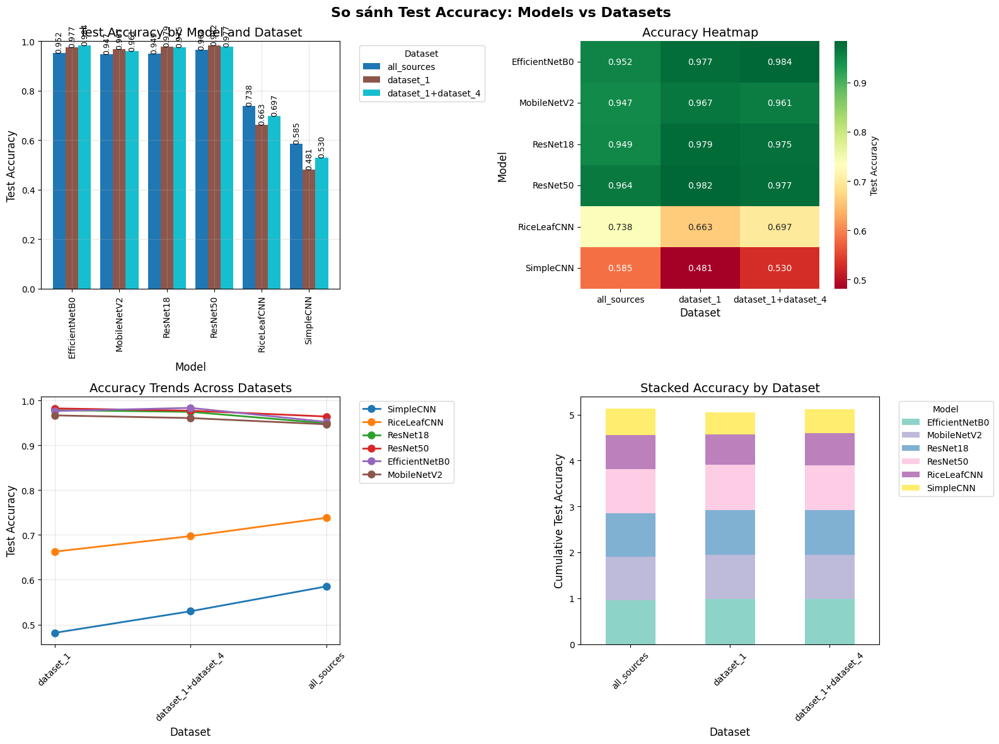


THỐNG KÊ CHI TIẾT ACCURACY THEO MODEL VÀ DATASET

 MODEL TỐT NHẤT CHO TỪNG DATASET:
   dataset_1: ResNet50 (0.9825)
   dataset_1+dataset_4: EfficientNetB0 (0.9836)
   all_sources: ResNet50 (0.9643)

 ACCURACY TRUNG BÌNH CỦA TỪNG MODEL:
   SimpleCNN: 0.5321 ± 0.0519
   RiceLeafCNN: 0.6995 ± 0.0379
   ResNet18: 0.9675 ± 0.0160
   ResNet50: 0.9747 ± 0.0093
   EfficientNetB0: 0.9708 ± 0.0164
   MobileNetV2: 0.9582 ± 0.0102

 XẾP HẠNG ĐỘ KHÓ CỦA CÁC DATASET (theo accuracy trung bình):
   1. all_sources: 0.8561 (Trung bình)
   2. dataset_1+dataset_4: 0.8539 (Trung bình)
   3. dataset_1: 0.8415 (Trung bình)


In [55]:
# SO SÁNH TEST ACCURACY GIỮA CÁC MODEL THEO TỪNG BỘ DATASET
def plot_model_dataset_accuracy_comparison(results_df):
    if len(results_df) == 0:
        print("Không có dữ liệu để hiển thị")
        return
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('So sánh Test Accuracy: Models vs Datasets', fontsize=16, fontweight='bold')
    
    # 1. Grouped Bar Chart
    ax1 = axes[0, 0]
    pivot_acc = results_df.pivot(index='Model', columns='Dataset', values='Test Acc')
    
    # Plot grouped bars
    pivot_acc.plot(kind='bar', ax=ax1, width=0.8, colormap='tab10')
    ax1.set_title('Test Accuracy by Model and Dataset', fontsize=14)
    ax1.set_ylabel('Test Accuracy', fontsize=12)
    ax1.set_xlabel('Model', fontsize=12)
    ax1.set_ylim(0, 1.0)
    ax1.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.grid(True, alpha=0.3)
    
    # Add value labels on bars
    for container in ax1.containers:
        ax1.bar_label(container, fmt='%.3f', fontsize=9, rotation=90)
    
    # 2. Heatmap
    ax2 = axes[0, 1]
    sns.heatmap(pivot_acc, annot=True, fmt='.3f', cmap='RdYlGn', 
                ax=ax2, cbar_kws={'label': 'Test Accuracy'})
    ax2.set_title('Accuracy Heatmap', fontsize=14)
    ax2.set_xlabel('Dataset', fontsize=12)
    ax2.set_ylabel('Model', fontsize=12)
    
    # 3. Line Plot - Xu hướng accuracy qua các dataset
    ax3 = axes[1, 0]
    for model in results_df['Model'].unique():
        model_data = results_df[results_df['Model'] == model]
        ax3.plot(model_data['Dataset'], model_data['Test Acc'], 
                marker='o', linewidth=2, markersize=8, label=model)
    
    ax3.set_title('Accuracy Trends Across Datasets', fontsize=14)
    ax3.set_ylabel('Test Accuracy', fontsize=12)
    ax3.set_xlabel('Dataset', fontsize=12)
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax3.grid(True, alpha=0.3)
    ax3.tick_params(axis='x', rotation=45)
    
    # 4. Stacked Bar Chart - Contribution comparison
    ax4 = axes[1, 1]
    pivot_acc_T = pivot_acc.T  # Transpose for stacked bars
    pivot_acc_T.plot(kind='bar', stacked=True, ax=ax4, colormap='Set3')
    ax4.set_title('Stacked Accuracy by Dataset', fontsize=14)
    ax4.set_ylabel('Cumulative Test Accuracy', fontsize=12)
    ax4.set_xlabel('Dataset', fontsize=12)
    ax4.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax4.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.savefig("/kaggle/working/model_dataset_accuracy_comparison.png", 
                dpi=150, bbox_inches='tight')
    plt.show()
    
    # Print summary statistics
    print("\n" + "="*60)
    print("THỐNG KÊ CHI TIẾT ACCURACY THEO MODEL VÀ DATASET")
    print("="*60)
    
    # Best performer for each dataset
    print("\n MODEL TỐT NHẤT CHO TỪNG DATASET:")
    for dataset in results_df['Dataset'].unique():
        dataset_data = results_df[results_df['Dataset'] == dataset]
        best_model = dataset_data.loc[dataset_data['Test Acc'].idxmax()]
        print(f"   {dataset}: {best_model['Model']} ({best_model['Test Acc']:.4f})")
    
    # Average performance by model
    print("\n ACCURACY TRUNG BÌNH CỦA TỪNG MODEL:")
    for model in results_df['Model'].unique():
        model_data = results_df[results_df['Model'] == model]
        avg_acc = model_data['Test Acc'].mean()
        std_acc = model_data['Test Acc'].std()
        print(f"   {model}: {avg_acc:.4f} ± {std_acc:.4f}")
    
    # Dataset difficulty ranking
    print("\n XẾP HẠNG ĐỘ KHÓ CỦA CÁC DATASET (theo accuracy trung bình):")
    dataset_avg = results_df.groupby('Dataset')['Test Acc'].mean().sort_values(ascending=False)
    for i, (dataset, avg_acc) in enumerate(dataset_avg.items(), 1):
        difficulty = "Dễ" if avg_acc > 0.9 else "Trung bình" if avg_acc > 0.8 else "Khó"
        print(f"   {i}. {dataset}: {avg_acc:.4f} ({difficulty})")

# Run the comparison
if 'results_df' in locals() and len(results_df) > 0:
    plot_model_dataset_accuracy_comparison(results_df)
elif 'df_results' in locals() and len(df_results) > 0:
    # If using the old variable name
    plot_model_dataset_accuracy_comparison(df_results)
else:
    # Create sample data for demonstration
    print("Không tìm thấy results_df. Tạo dữ liệu mẫu để demo...")
    sample_data = {
        'Model': ['SimpleCNN', 'RiceLeafCNN', 'ResNet18', 'MobileNetV2'] * 3,
        'Dataset': ['all_sources'] * 4 + ['dataset_1'] * 4 + ['dataset_1+dataset_2'] * 4,
        'Test Acc': [0.85, 0.89, 0.92, 0.87, 0.83, 0.88, 0.91, 0.86, 0.86, 0.90, 0.93, 0.88]
    }
    sample_df = pd.DataFrame(sample_data)
    plot_model_dataset_accuracy_comparison(sample_df)


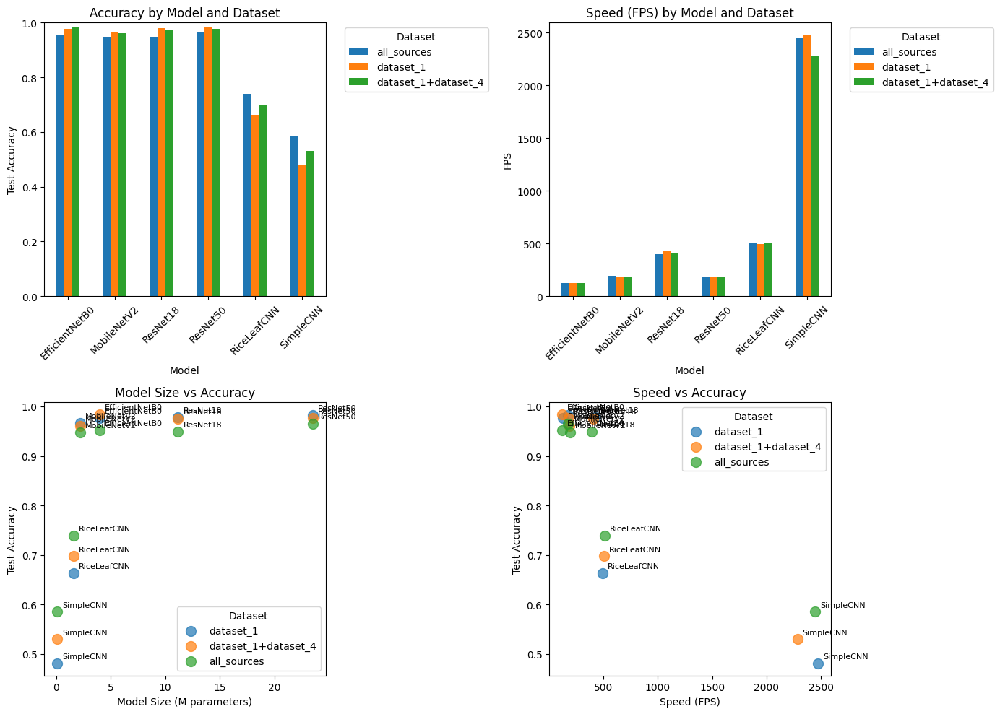

In [56]:
def plot_model_comparison_by_dataset(results_df):
    """Plot performance comparison of models across different datasets"""
    plt.figure(figsize=(14, 10))
    
    # Accuracy comparison
    plt.subplot(2, 2, 1)
    pivot_acc = results_df.pivot(index='Model', columns='Dataset', values='Test Acc')
    pivot_acc.plot(kind='bar', ax=plt.gca())
    plt.title('Accuracy by Model and Dataset')
    plt.ylabel('Test Accuracy')
    plt.xticks(rotation=45)
    plt.ylim(0, 1.0)
    plt.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Speed (FPS) comparison  
    plt.subplot(2, 2, 2)
    pivot_fps = results_df.pivot(index='Model', columns='Dataset', values='FPS')
    pivot_fps.plot(kind='bar', ax=plt.gca())
    plt.title('Speed (FPS) by Model and Dataset')
    plt.ylabel('FPS')
    plt.xticks(rotation=45)
    plt.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.subplot(2, 2, 3)
    for dataset in results_df['Dataset'].unique():
        df_subset = results_df[results_df['Dataset'] == dataset]
        plt.scatter(df_subset['Params (M)'], df_subset['Test Acc'], 
                   label=dataset, s=100, alpha=0.7)
        for _, row in df_subset.iterrows():
            plt.annotate(row['Model'], 
                        (row['Params (M)'], row['Test Acc']),
                        xytext=(5, 5), textcoords='offset points', fontsize=8)
    
    plt.xlabel('Model Size (M parameters)')
    plt.ylabel('Test Accuracy')
    plt.title('Model Size vs Accuracy')
    plt.legend(title='Dataset')
    plt.subplot(2, 2, 4)
    for dataset in results_df['Dataset'].unique():
        df_subset = results_df[results_df['Dataset'] == dataset]
        plt.scatter(df_subset['FPS'], df_subset['Test Acc'], 
                   label=dataset, s=100, alpha=0.7)
        for _, row in df_subset.iterrows():
            plt.annotate(row['Model'], 
                        (row['FPS'], row['Test Acc']),
                        xytext=(5, 5), textcoords='offset points', fontsize=8)
    
    plt.xlabel('Speed (FPS)')
    plt.ylabel('Test Accuracy')
    plt.title('Speed vs Accuracy')
    plt.legend(title='Dataset')
    plt.tight_layout()
    plt.savefig('/kaggle/working/model_dataset_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

if len(results_df) > 0:
    plot_model_comparison_by_dataset(results_df)

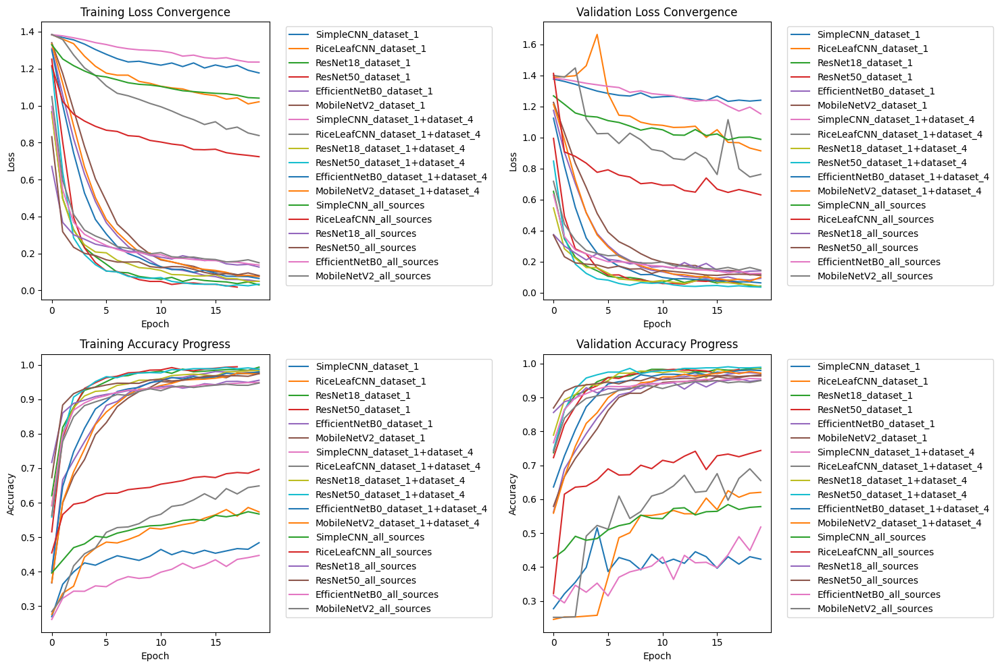


Training Stability Analysis:

SimpleCNN_dataset_1:
  Final train/val loss gap: 0.0626
  Max train/val loss gap: 0.0626
  Epochs until min val loss: 17
  High validation loss - model may be underfitting

RiceLeafCNN_dataset_1:
  Final train/val loss gap: -0.1076
  Max train/val loss gap: 0.4500
  Epochs until min val loss: 20
  High validation loss - model may be underfitting

ResNet18_dataset_1:
  Final train/val loss gap: 0.0119
  Max train/val loss gap: 0.0339
  Epochs until min val loss: 20

ResNet50_dataset_1:
  Final train/val loss gap: 0.0376
  Max train/val loss gap: 0.0507
  Epochs until min val loss: 13

EfficientNetB0_dataset_1:
  Final train/val loss gap: 0.0427
  Max train/val loss gap: 0.0427
  Epochs until min val loss: 19

MobileNetV2_dataset_1:
  Final train/val loss gap: 0.0406
  Max train/val loss gap: 0.0528
  Epochs until min val loss: 19

SimpleCNN_dataset_1+dataset_4:
  Final train/val loss gap: -0.0843
  Max train/val loss gap: 0.0045
  Epochs until min val loss

In [57]:
def analyze_training_stability(model_histories):
    """Analyze training curves for stability and convergence"""
    if not model_histories:
        print("No training histories available")
        return
        
    plt.figure(figsize=(15, 10))
    
    # Loss stability 
    plt.subplot(2, 2, 1)
    for model_name, history in model_histories.items():
        if 'train_loss' in history:
            plt.plot(history['train_loss'], label=f"{model_name}")
    plt.title('Training Loss Convergence')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Validation loss stability
    plt.subplot(2, 2, 2)
    for model_name, history in model_histories.items():
        if 'val_loss' in history:
            plt.plot(history['val_loss'], label=f"{model_name}")
    plt.title('Validation Loss Convergence')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Accuracy progress
    plt.subplot(2, 2, 3)
    for model_name, history in model_histories.items():
        if 'train_acc' in history:
            plt.plot(history['train_acc'], label=f"{model_name}")
    plt.title('Training Accuracy Progress')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Validation accuracy progress
    plt.subplot(2, 2, 4)
    for model_name, history in model_histories.items():
        if 'val_acc' in history:
            plt.plot(history['val_acc'], label=f"{model_name}")
    plt.title('Validation Accuracy Progress')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/training_stability_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Overfitting analysis
    print("\nTraining Stability Analysis:")
    print("="*50)
    for model_name, history in model_histories.items():
        if 'train_loss' in history and 'val_loss' in history:
            train_loss = history['train_loss']
            val_loss = history['val_loss']
            
            if len(train_loss) > 0 and len(val_loss) > 0:
                # Calculate generalization gap
                min_len = min(len(train_loss), len(val_loss))
                gen_gaps = [val_loss[i] - train_loss[i] for i in range(min_len)]
                
                print(f"\n{model_name}:")
                print(f"  Final train/val loss gap: {gen_gaps[-1]:.4f}")
                print(f"  Max train/val loss gap: {max(gen_gaps):.4f}")
                print(f"  Epochs until min val loss: {val_loss.index(min(val_loss))+1}")
                
                # Flag potential issues
                if gen_gaps[-1] > 0.1:
                    print("  Potential overfitting detected")
                if min(val_loss) > 0.5:
                    print("  High validation loss - model may be underfitting")

if 'histories' in locals() and histories:
    analyze_training_stability(histories)

## Đánh giá model

In [58]:
df = pd.read_csv("/kaggle/working/comprehensive_results.csv")

best_row = df.sort_values("Test Acc", ascending=False).iloc[0]
best_ckpt = best_row["Checkpoint"]
best_model_name = best_row["Model"]
best_acc = best_row["Test Acc"]
print(f"Best model: {best_model_name} ({best_ckpt}), acc={best_acc:.4f}")

Best model: EfficientNetB0 (/kaggle/working/EfficientNetB0_dataset_1+dataset_4_best.pth), acc=0.9836


In [59]:
def evaluate_model(model, test_loader, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    acc = np.mean(np.array(all_labels) == np.array(all_preds))
    print(f"Test Accuracy: {acc:.4f}")
    print("\nClassification Report:\n", classification_report(all_labels, all_preds, target_names=class_names))

    plt.figure(figsize=(7,6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

Best by F1: EfficientNetB0 @ dataset_1+dataset_4 (0.9835)
Test Accuracy: 0.7995

Classification Report:
               precision    recall  f1-score   support

  brown_spot       0.94      0.79      0.86       712
  leaf_blast       0.58      0.91      0.71       433
 leaf_blight       0.98      0.75      0.85       521
     healthy       0.79      0.76      0.78       578

    accuracy                           0.80      2244
   macro avg       0.82      0.81      0.80      2244
weighted avg       0.84      0.80      0.81      2244



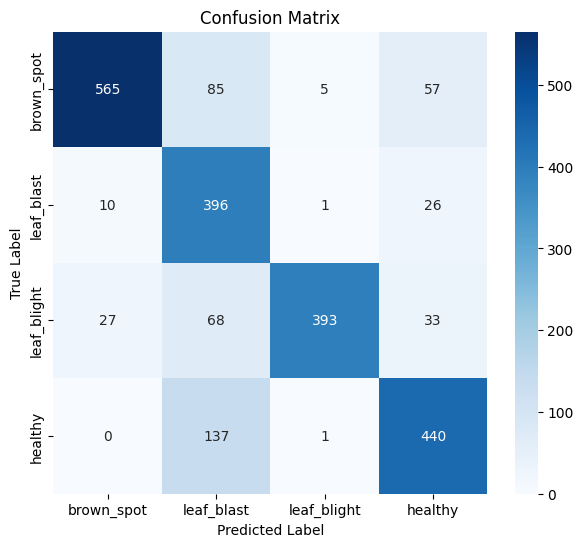

In [60]:
class_names = train_df["label_name"].unique().tolist()

def select_best_row(results_df: pd.DataFrame, key="F1", dataset: str | None = None):
    df = results_df if dataset is None else results_df[results_df["Dataset"] == dataset]
    if len(df) == 0:
        raise ValueError(f"Không tìm thấy run nào cho dataset={dataset}")
    return df.loc[df[key].idxmax()]   # Series

def load_model_from_row(best_row, models_dict, device):
    model_name = best_row["Model"]
    ckpt_path  = best_row["Checkpoint"]
    if model_name not in models_dict:
        raise KeyError(f"'{model_name}' không có trong models_dict")
    model = models_dict[model_name]().to(device)
    state = torch.load(ckpt_path, map_location=device)
    # hỗ trợ cả state_dict thuần và checkpoint dict
    if isinstance(state, dict) and "model_state_dict" in state:
        model.load_state_dict(state["model_state_dict"])
    else:
        model.load_state_dict(state)
    model.eval()
    return model, ckpt_path

def auto_load_best_model(results_csv, models_dict, device, key="F1", dataset=None):
    results_df = pd.read_csv(results_csv)
    best_row = select_best_row(results_df, key=key, dataset=dataset)
    print(f"Best by {key}: {best_row['Model']} @ {best_row['Dataset']} ({best_row[key]:.4f})")
    model, ckpt = load_model_from_row(best_row, models_dict, device)
    return model, best_row

# ===== DÙNG =====
results_csv = "/kaggle/working/comprehensive_results.csv"
model_best, info = auto_load_best_model(results_csv, models_list, device, key="F1", dataset=None)

# Nếu bạn đã có sẵn test_loader + class_names:
evaluate_model(model_best, test_loader, class_names)

## Dự đoán

In [61]:
def infer_arch_from_path(ckpt_path: str) -> str:
    """Đoán tên kiến trúc từ tên file checkpoint."""
    base = os.path.basename(ckpt_path).lower()
    mapping = {
        "resnet18": "ResNet18",
        "resnet50": "ResNet50",
        "mobilenetv2": "MobileNetV2",
        "efficientnetb0": "EfficientNetB0",
        "riceleafcnn": "RiceLeafCNN",
        "simplecnn": "SimpleCNN",
    }
    for k, v in mapping.items():
        if k in base:
            return v
    raise ValueError(f"Không suy luận được kiến trúc từ tên file: {base}")

def load_saved_model_by_ckpt(ckpt_path, models_dict, device, strict_head="auto"):
    """
    Khởi tạo đúng kiến trúc theo ckpt_path rồi load state_dict.
    - models_dict: {"ResNet18": lambda: build_resnet18(num_classes), ...}
    - strict_head="auto": thử strict=True; nếu chỉ lỗi ở head thì fallback strict=False.
    """
    arch = infer_arch_from_path(ckpt_path)
    if arch not in models_dict:
        raise KeyError(f"'{arch}' không có trong models_dict")

    model = models_dict[arch]().to(device)
    state = torch.load(ckpt_path, map_location=device)
    if isinstance(state, dict) and "model_state_dict" in state:
        state = state["model_state_dict"]

    try:
        model.load_state_dict(state, strict=True)
    except RuntimeError as e:
        if strict_head == "auto":
            print(f"strict=True lỗi ({e.__class__.__name__}): thử strict=False (có thể sai head).")
            model.load_state_dict(state, strict=False)
        else:
            raise
    model.eval()
    return model, arch

def ensure_save_dir_from_path(path: str) -> str:
    """Trả về thư mục hợp lệ để lưu file theo một 'path' (file hoặc folder)."""
    if os.path.isdir(path):
        save_dir = path
    else:
        save_dir = os.path.dirname(path) or "."
    os.makedirs(save_dir, exist_ok=True)
    return save_dir


In [62]:

def demo_prediction_with_saved_model(checkpoint_path="../output", dataset_path="data", num_samples=6):
    print("DEMO PREDICTION VỚI MODEL ĐÃ SAVE")
    print("="*60)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    all_images = []
    class_names = None
    if not isinstance(dataset_path, pd.DataFrame):
        raise TypeError("`dataset_path` phải là str/path hoặc pandas.DataFrame")
    df_in = dataset_path.copy()
    if 'path' not in df_in.columns:
        raise ValueError("DataFrame phải có cột 'path'.")
    label_col = None
    if 'label_name' in df_in.columns:
        label_col = 'label_name'
    else:
        for c in ['label', 'class', 'target', 'y', 'category']:
            if c in df_in.columns:
                label_col = c; break
    has_label_id = 'label_id' in df_in.columns
    if label_col is None and not has_label_id:
        raise ValueError("Thiếu nhãn: cần 'label_name' hoặc 1 trong ['label','class','target','y','category'] hoặc 'label_id'.")

    if has_label_id and 'label_name' in df_in.columns:
        id_name = df_in[['label_id','label_name']].drop_duplicates().sort_values('label_id')
        class_names = id_name['label_name'].astype(str).tolist()
        id_to_idx = {int(i): idx for idx, i in enumerate(id_name['label_id'].tolist())}
        for _, row in df_in.iterrows():
            img_path = str(row['path'])
            if os.path.isfile(img_path) and img_path.lower().endswith(('.jpg','.jpeg','.png')):
                lid = int(row['label_id'])
                if lid in id_to_idx:
                    all_images.append({
                        'path': img_path,
                        'true_label': str(row['label_name']),
                        'true_label_idx': id_to_idx[lid],
                    })
    elif has_label_id and label_col is None:
        uniq_ids = sorted(set(int(x) for x in df_in['label_id'].tolist()))
        class_names = [str(i) for i in uniq_ids]
        id_to_idx = {i: idx for idx, i in enumerate(uniq_ids)}
        for _, row in df_in.iterrows():
            img_path = str(row['path'])
            if os.path.isfile(img_path) and img_path.lower().endswith(('.jpg','.jpeg','.png')):
                lid = int(row['label_id'])
                if lid in id_to_idx:
                    all_images.append({
                        'path': img_path,
                        'true_label': str(lid),
                        'true_label_idx': id_to_idx[lid],
                    })
    else:
        labels_series = df_in[label_col].astype(str)
        class_names = sorted(labels_series.unique().tolist())
        class_to_idx = {c:i for i,c in enumerate(class_names)}
        for _, row in df_in.iterrows():
            img_path = str(row['path'])
            if os.path.isfile(img_path) and img_path.lower().endswith(('.jpg','.jpeg','.png')):
                name = str(row[label_col])
                all_images.append({
                    'path': img_path,
                    'true_label': name,
                    'true_label_idx': class_to_idx[name],
                })

    if len(all_images) == 0:
        raise RuntimeError("❌ Không tìm thấy ảnh nào để test!")
    print(f"Tìm thấy {len(all_images)} ảnh. Số lớp: {len(class_names)} -> {class_names}")
    models_dict = {
        "SimpleCNN":      lambda: SimpleCNN(len(class_names)),
        "RiceLeafCNN":    lambda: RiceLeafCNN(len(class_names)),
        "ResNet18":       lambda: build_resnet18(len(class_names)),
        "ResNet50":       lambda: build_resnet50(len(class_names)),
        "EfficientNetB0": lambda: build_efficientnet(len(class_names)),
        "MobileNetV2":    lambda: build_mobilenet(len(class_names)),
    }
    model, model_name = load_saved_model_by_ckpt(
        ckpt_path=checkpoint_path,
        models_dict=models_dict,
        device=device,
        strict_head="auto",
    )

    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
    random_images = random.sample(all_images, min(num_samples, len(all_images)))
    rows = 2 if len(random_images) > 3 else 1
    cols = min(3, len(random_images))
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    if hasattr(axes, "ravel"):
        axes = axes.ravel()
    else:
        axes = [axes]

    total_time = 0.0
    correct_predictions = 0

    for idx, img_info in enumerate(random_images):
        img_path = img_info['path']
        image = Image.open(img_path).convert('RGB')
        input_tensor = transform(image).unsqueeze(0).to(device)

        start_time = time.time()
        with torch.no_grad():
            outputs = model(input_tensor)
            probabilities = F.softmax(outputs, dim=1)
            confidence, predicted = torch.max(probabilities, 1)
        end_time = time.time()

        inference_time = end_time - start_time
        total_time += inference_time

        predicted_idx = predicted.item()
        predicted_class = class_names[predicted_idx]
        confidence_score = float(confidence.item())
        true_class = img_info['true_label']
        is_correct = (str(predicted_class) == str(true_class))
        if is_correct:
            correct_predictions += 1

        ax = axes[idx]
        ax.imshow(image)
        ax.set_title(
            f"True: {true_class}\nPred: {predicted_class}\n"
            f"Conf: {confidence_score:.3f}\n"
            f"Time: {inference_time*1000:.1f}ms",
            fontsize=10
        )
        ax.axis('off')
        for spine in ax.spines.values():
            spine.set_edgecolor('green' if is_correct else 'red')
            spine.set_linewidth(3)

        status = "đúng" if is_correct else "sai"
        print(f"{os.path.basename(img_path)} | True: {true_class} | Pred: {predicted_class} "
              f"| {confidence_score:.4f} | {inference_time*1000:.2f}ms | {status}")

    # Ẩn subplot thừa
    for j in range(len(random_images), len(axes)):
        axes[j].axis('off')
    plt.suptitle(f'Random Prediction Demo - {model_name}', fontsize=16)
    plt.tight_layout()
    # Lưu ảnh DEMO vào đúng thư mục 
    save_dir = ensure_save_dir_from_path(checkpoint_path)
    out_img = os.path.join(save_dir, "demo_predictions.png")
    plt.savefig(out_img, dpi=150, bbox_inches='tight')
    plt.show()
    #  Summary 
    accuracy = correct_predictions / len(random_images)
    avg_time = total_time / len(random_images)
    fps = len(random_images) / total_time if total_time > 0 else float('inf')

    print("DEMO SUMMARY:")
    print("="*40)
    print(f"Model: {model_name}")
    print(f"Accuracy: {correct_predictions}/{len(random_images)} ({accuracy*100:.1f}%)")
    print(f"Avg Time: {avg_time*1000:.2f}ms/image")
    print(f"Speed: {fps:.1f} FPS")
    print(f"Saved preview: {out_img}")

DEMO PREDICTION VỚI MODEL ĐÃ SAVE
Tìm thấy 2786 ảnh. Số lớp: 4 -> ['brown_spot', 'leaf_blast', 'leaf_blight', 'healthy']
augmented_image_362.jpg | True: brown_spot | Pred: brown_spot | 0.9858 | 9.71ms | đúng
augmented_image_261.jpg | True: leaf_blight | Pred: leaf_blight | 0.9717 | 8.57ms | đúng
augmented_image_107.jpg | True: leaf_blast | Pred: leaf_blast | 0.9989 | 8.61ms | đúng
augmented_image_375.jpg | True: leaf_blight | Pred: leaf_blast | 0.9928 | 8.49ms | sai
augmented_image_405.jpg | True: leaf_blast | Pred: leaf_blast | 0.9982 | 8.56ms | đúng
augmented_image_187.jpg | True: healthy | Pred: healthy | 0.9992 | 8.52ms | đúng


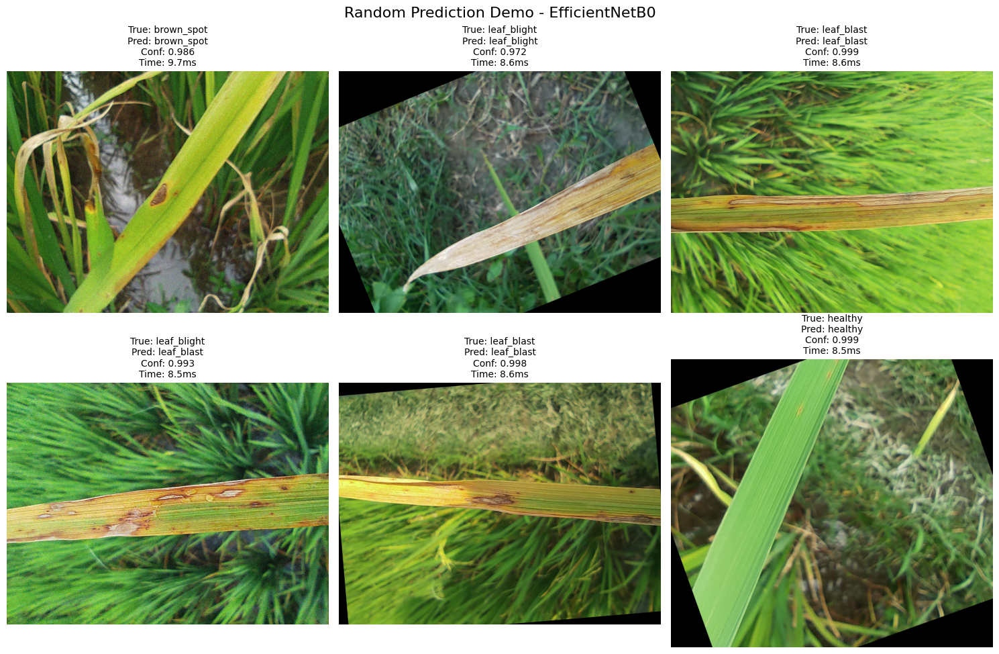

DEMO SUMMARY:
Model: EfficientNetB0
Accuracy: 5/6 (83.3%)
Avg Time: 8.74ms/image
Speed: 114.4 FPS
Saved preview: /kaggle/working/demo_predictions.png


In [63]:
demo_prediction_with_saved_model(
    checkpoint_path=best_ckpt,   
    dataset_path=df_test,
    num_samples=6
)